In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)


import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/lending-club-20072020q1/Loan_status_2007-2020Q3.gzip
/kaggle/input/lending-club-20072020q1/LCDataDictionary.xlsx


In [2]:
pip install seaborn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 5.9 MB/s eta 0:00:00a 0:00:01

[notice] A new release of pip is available: 23.0.1 -> 24.0
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [5]:
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
loans = pd.read_csv('/kaggle/input/lending-club-20072020q1/Loan_status_2007-2020Q3.gzip')


/tmp/ipykernel_13/2378649714.py:1: DtypeWarning: Columns (1,48,58,117,127,128,129,132,133,134,137) have mixed types. Specify dtype option on import or set low_memory=False.
  loans = pd.read_csv('/kaggle/input/lending-club-20072020q1/Loan_status_2007-2020Q3.gzip')


In [7]:
loans.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2925493 entries, 0 to 2925492
Columns: 142 entries, Unnamed: 0 to debt_settlement_flag
dtypes: float64(106), int64(1), object(35)
memory usage: 3.1+ GB


In [12]:
loans.head(5)

,Unnamed: 0,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,debt_settlement_flag
0,0,1077501,5000.0,5000.0,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N
1,1,1077430,2500.0,2500.0,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N
2,2,1077175,2400.0,2400.0,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N
3,3,1076863,10000.0,10000.0,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N
4,4,1075358,3000.0,3000.0,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N


In [7]:
loans['loan_status'].value_counts(dropna=False)

loan_status
Fully Paid                                             1497783
Current                                                1031016
Charged Off                                             362548
Late (31-120 days)                                       16154
In Grace Period                                          10028
Late (16-30 days)                                         2719
Issued                                                    2062
Does not meet the credit policy. Status:Fully Paid        1988
Does not meet the credit policy. Status:Charged Off        761
Default                                                    433
NaN                                                          1
Name: count, dtype: int64

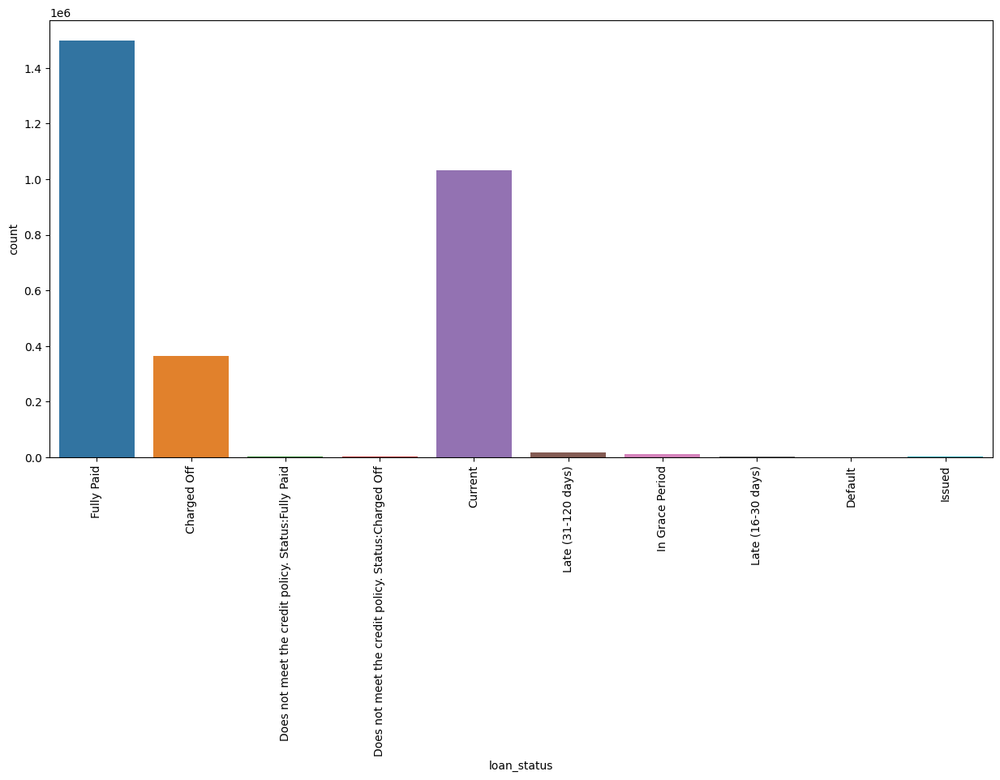

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt

# LOAN STATUS COUNTPLOT
plt.figure(figsize=(15, 7)) 

sns.countplot(x='loan_status', data=loans)
plt.xticks(rotation=90)
plt.show()


In [8]:
loans.shape

(2925493, 142)

In [14]:
#All Column Name

for column_name in loans.columns:
    print(column_name)

loan_amnt
funded_amnt
funded_amnt_inv
term
int_rate
installment
grade
sub_grade
emp_title
emp_length
home_ownership
annual_inc
verification_status
issue_d
loan_status
pymnt_plan
url
purpose
title
zip_code
addr_state
dti
delinq_2yrs
earliest_cr_line
fico_range_low
fico_range_high
inq_last_6mths
mths_since_last_delinq
mths_since_last_record
open_acc
pub_rec
revol_bal
revol_util
total_acc
initial_list_status
out_prncp
out_prncp_inv
total_pymnt
total_pymnt_inv
total_rec_prncp
total_rec_int
total_rec_late_fee
recoveries
collection_recovery_fee
last_pymnt_d
last_pymnt_amnt
next_pymnt_d
last_credit_pull_d
last_fico_range_high
last_fico_range_low
collections_12_mths_ex_med
mths_since_last_major_derog
policy_code
application_type
annual_inc_joint
dti_joint
verification_status_joint
acc_now_delinq
tot_coll_amt
tot_cur_bal
open_acc_6m
open_act_il
open_il_12m
open_il_24m
mths_since_rcnt_il
total_bal_il
il_util
open_rv_12m
open_rv_24m
max_bal_bc
all_util
total_rev_hi_lim
inq_fi
total_cu_tl
inq_last

In [15]:
print(loans.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2925493 entries, 0 to 2925492
Columns: 142 entries, Unnamed: 0 to debt_settlement_flag
dtypes: float64(106), int64(1), object(35)
memory usage: 3.1+ GB
None


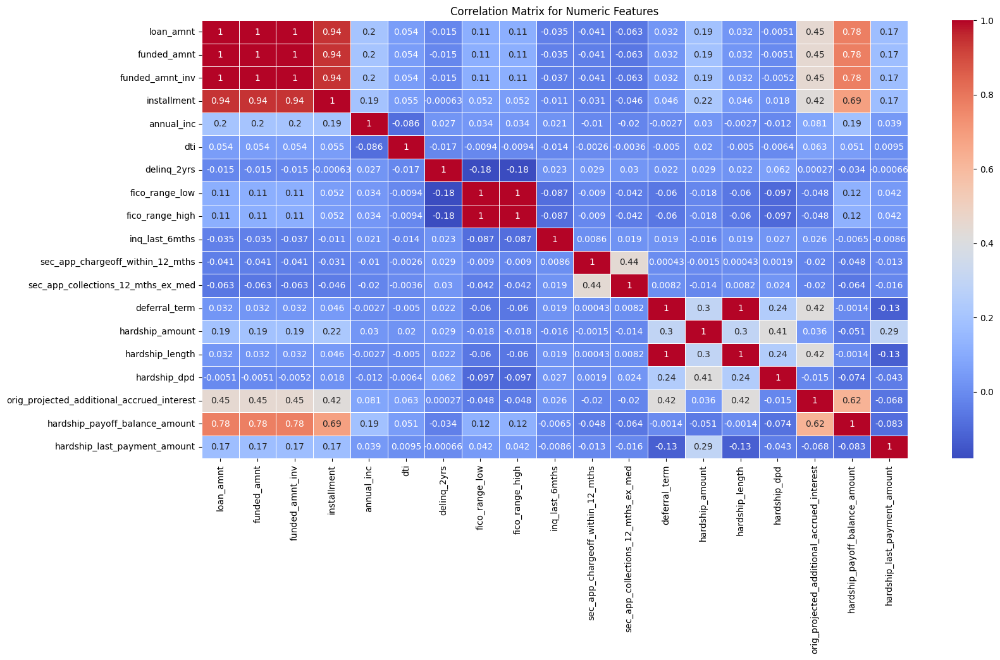

In [12]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# List of numeric columns
numeric_columns = ['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'installment', 'annual_inc', 'dti',
                   'delinq_2yrs', 'fico_range_low', 'fico_range_high', 'inq_last_6mths',
                   # ... (all other numeric columns)
                   'sec_app_chargeoff_within_12_mths',
                   'sec_app_collections_12_mths_ex_med', 'deferral_term', 'hardship_amount',
                   'hardship_length', 'hardship_dpd', 'orig_projected_additional_accrued_interest',
                   'hardship_payoff_balance_amount', 'hardship_last_payment_amount']

numeric_df = loans[numeric_columns]

correlation_matrix = numeric_df.corr()
plt.figure(figsize=(18, 9))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix for Numeric Features')
plt.show()


In [13]:
# All Categorical Features

categorical_feature = loans.select_dtypes(include=['object', 'category']).columns.tolist()
print(categorical_feature)

['term', 'int_rate', 'grade', 'sub_grade', 'emp_title', 'emp_length', 'home_ownership', 'verification_status', 'issue_d', 'loan_status', 'pymnt_plan', 'url', 'purpose', 'title', 'zip_code', 'addr_state', 'earliest_cr_line', 'revol_util', 'initial_list_status', 'last_pymnt_d', 'next_pymnt_d', 'last_credit_pull_d', 'application_type', 'verification_status_joint', 'sec_app_earliest_cr_line', 'hardship_flag', 'hardship_type', 'hardship_reason', 'hardship_status', 'hardship_start_date', 'hardship_end_date', 'payment_plan_start_date', 'hardship_loan_status', 'debt_settlement_flag']


<Figure size 640x480 with 0 Axes>

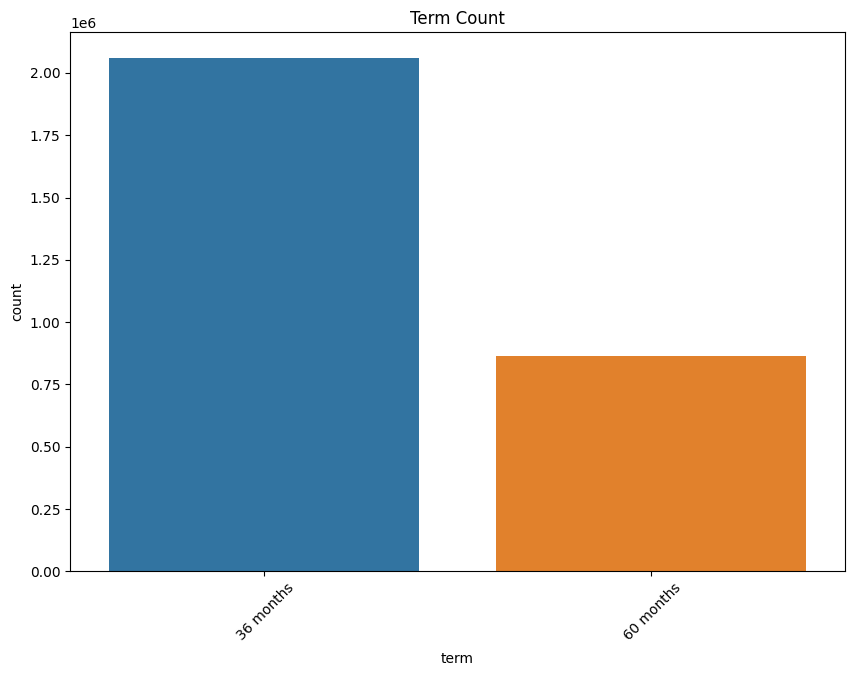

<Figure size 640x480 with 0 Axes>

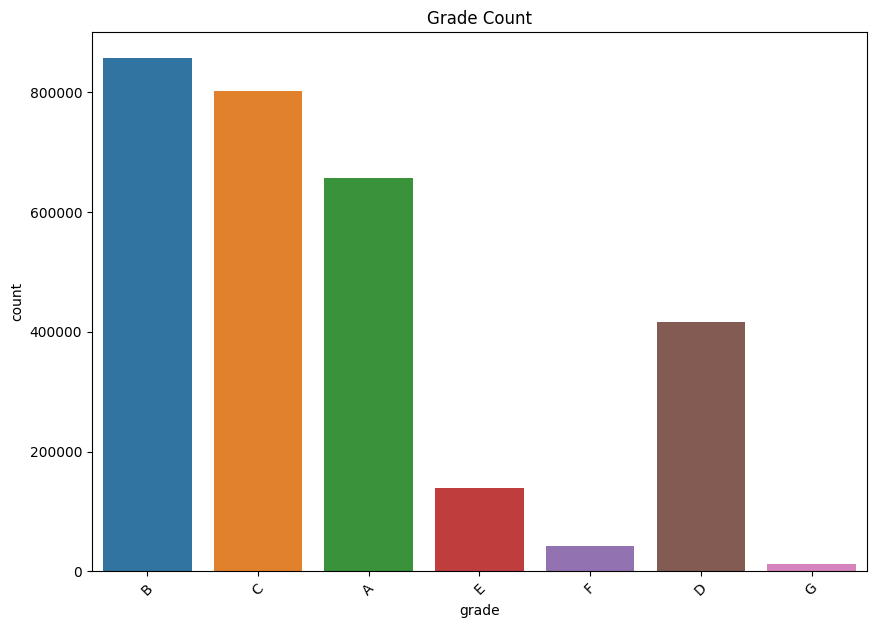

<Figure size 640x480 with 0 Axes>

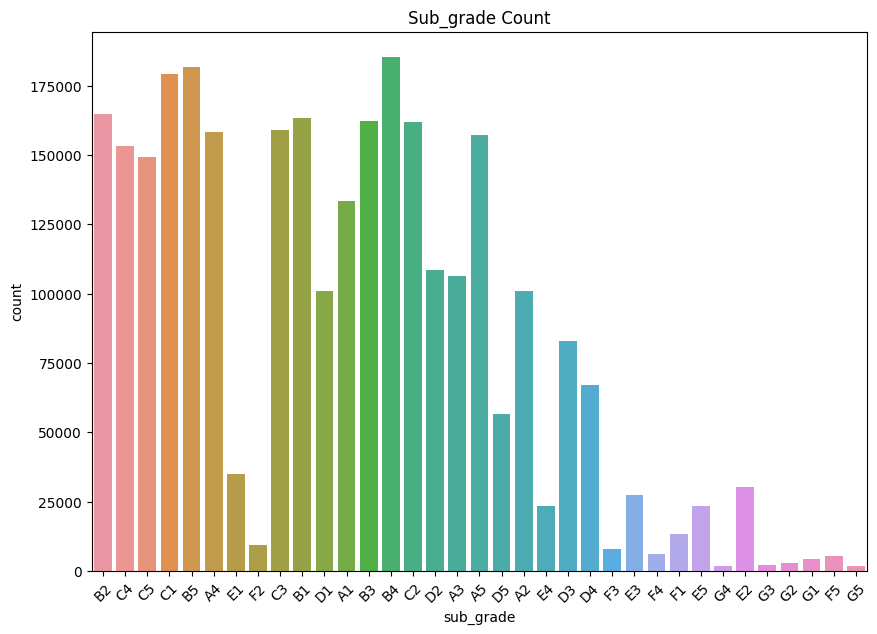

<Figure size 640x480 with 0 Axes>

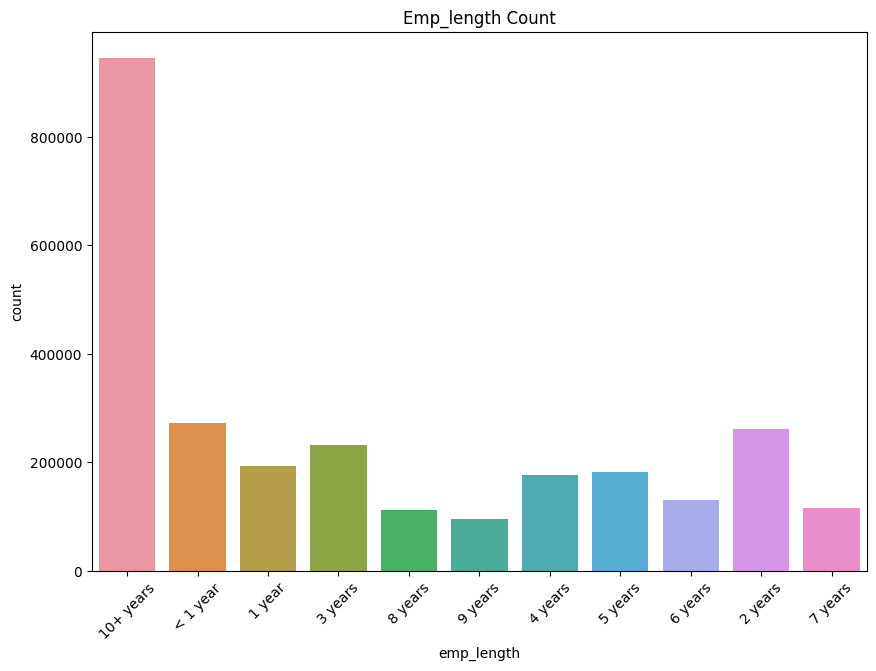

<Figure size 640x480 with 0 Axes>

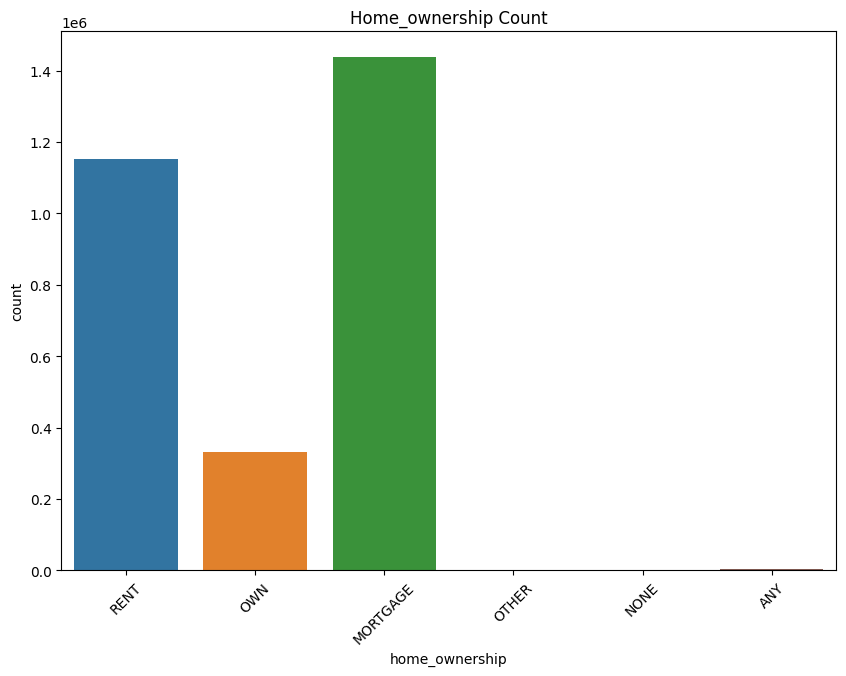

<Figure size 640x480 with 0 Axes>

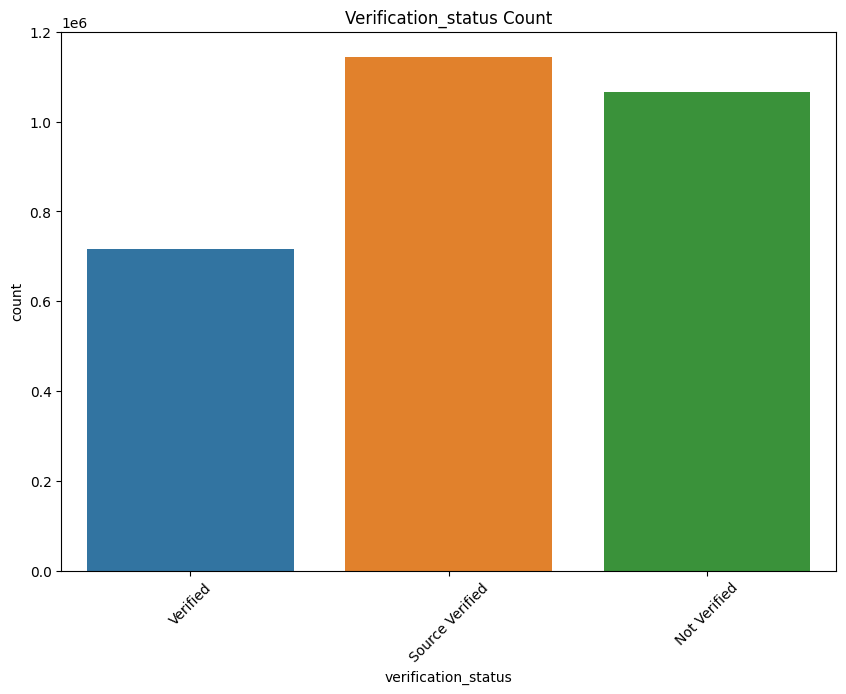

<Figure size 640x480 with 0 Axes>

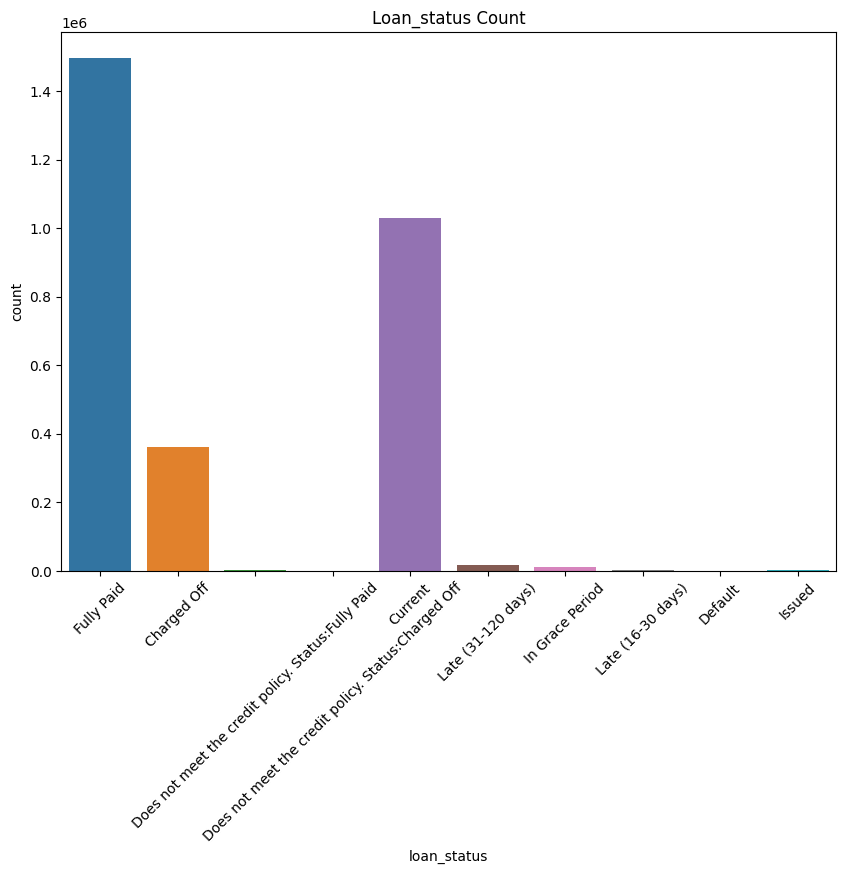

<Figure size 640x480 with 0 Axes>

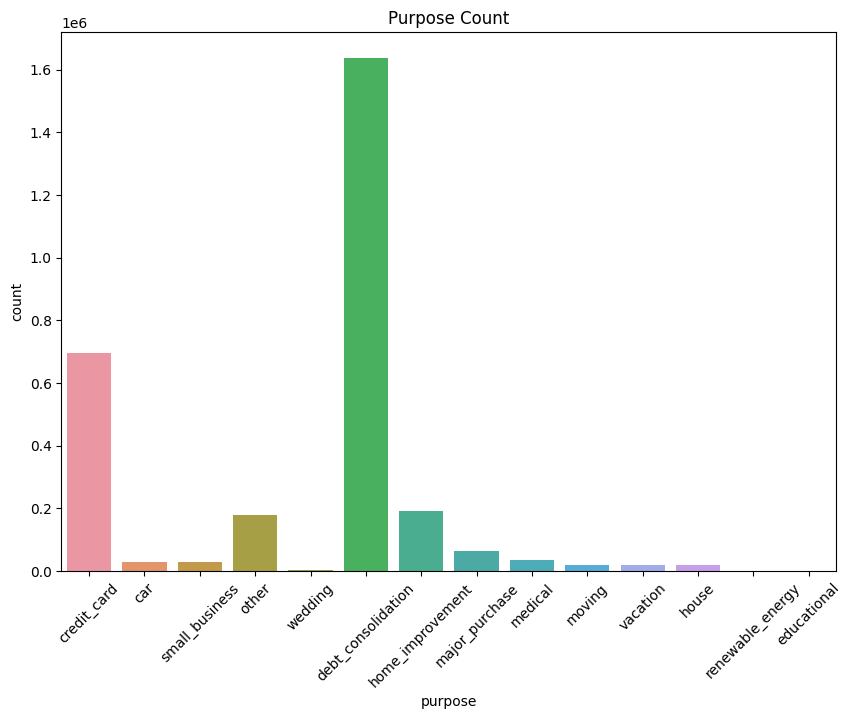

<Figure size 640x480 with 0 Axes>

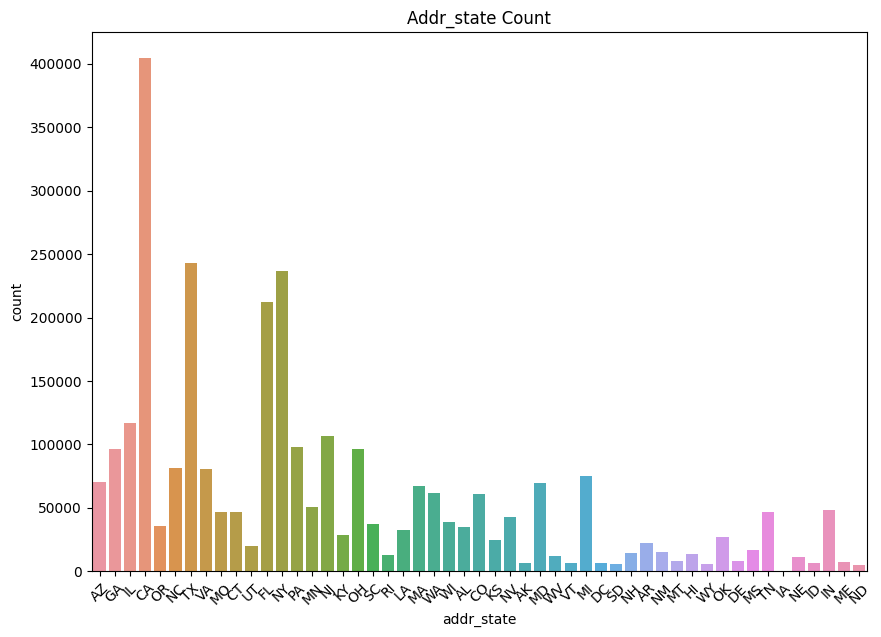

<Figure size 640x480 with 0 Axes>

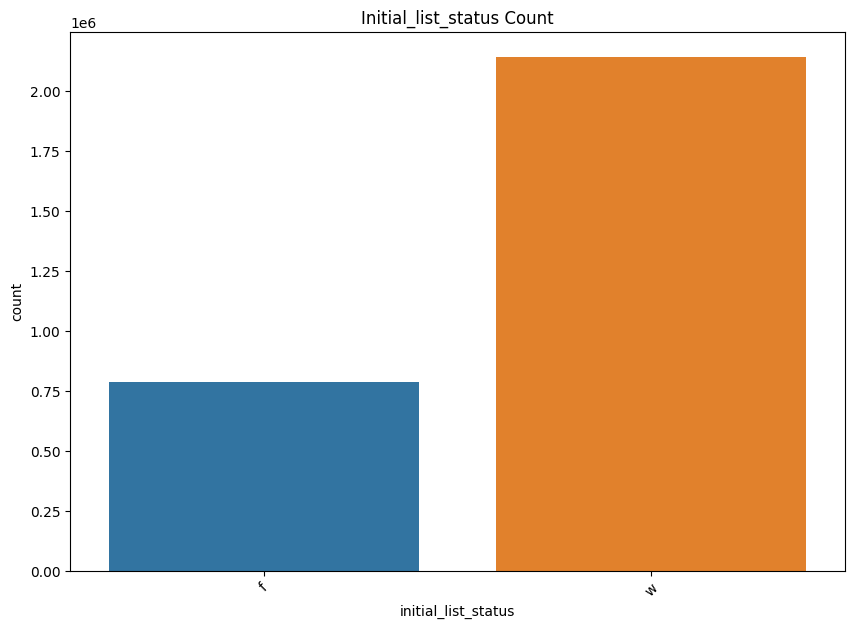

<Figure size 640x480 with 0 Axes>

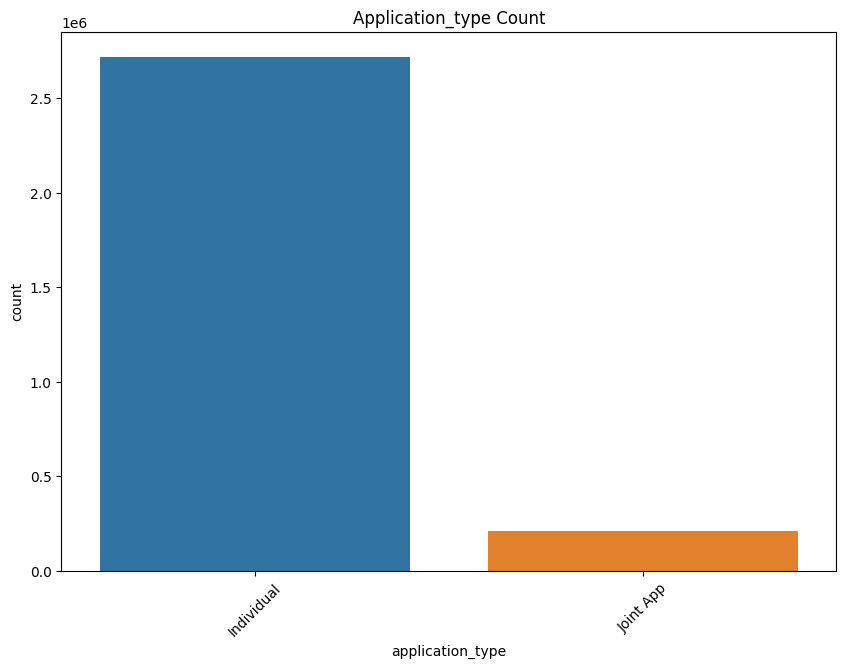

<Figure size 640x480 with 0 Axes>

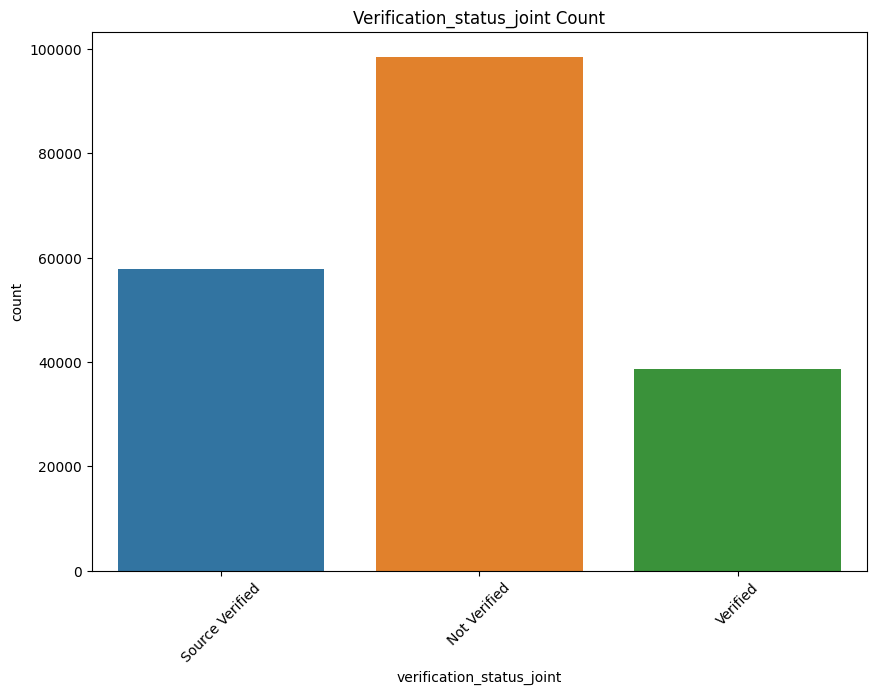

<Figure size 640x480 with 0 Axes>

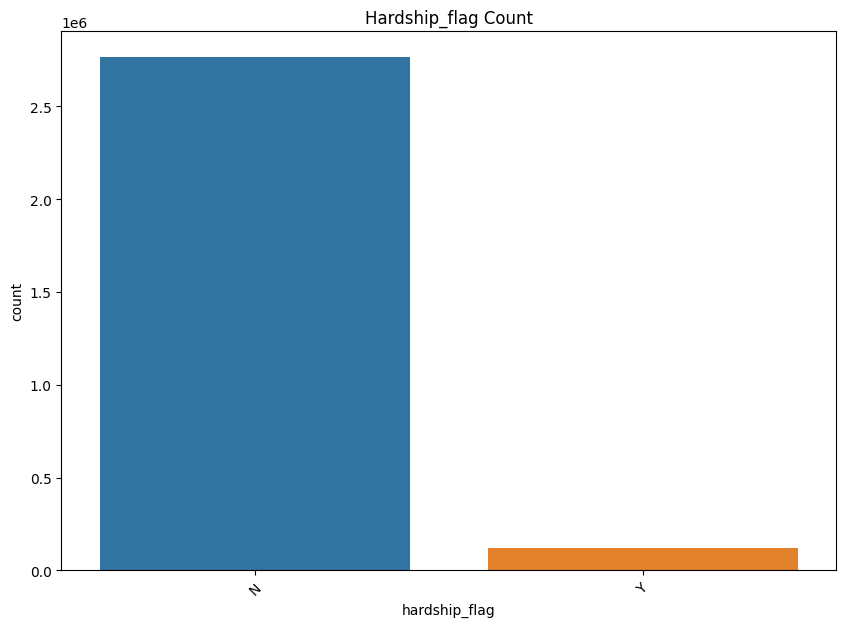

<Figure size 640x480 with 0 Axes>

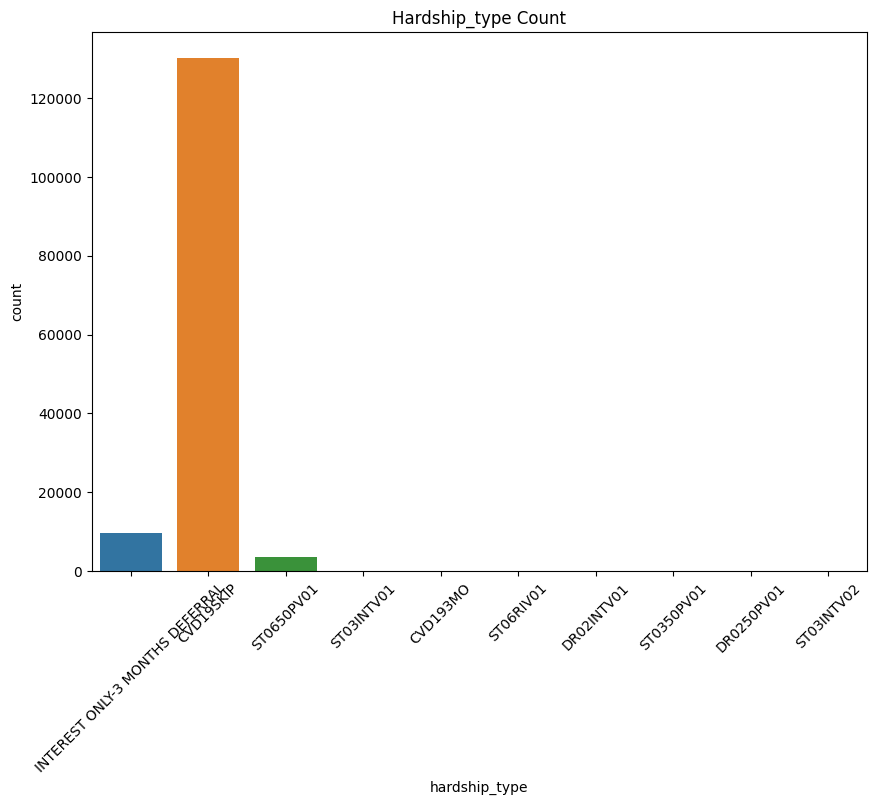

<Figure size 640x480 with 0 Axes>

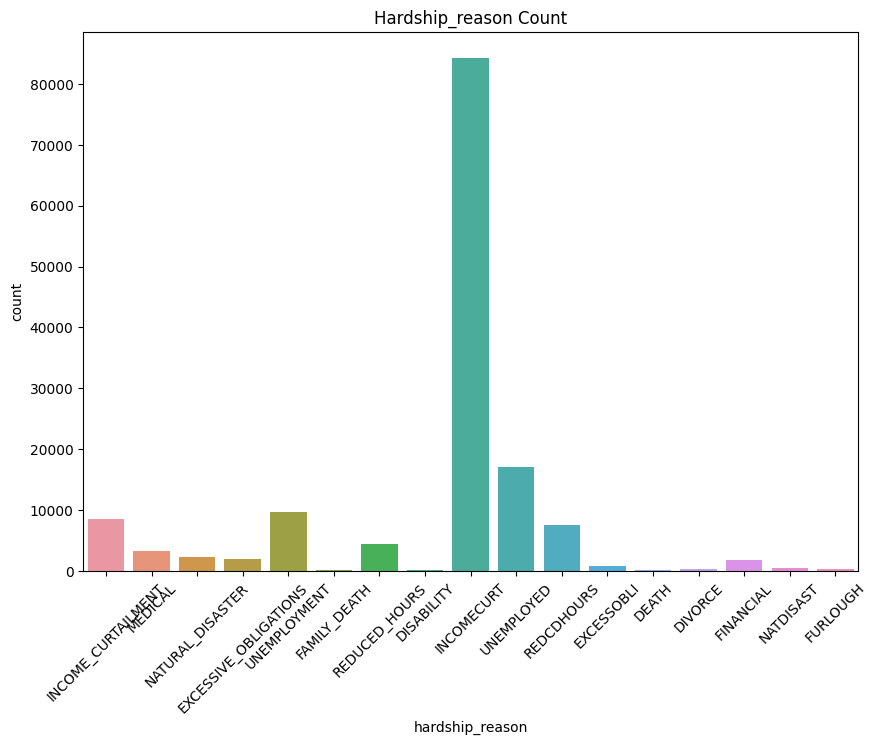

<Figure size 640x480 with 0 Axes>

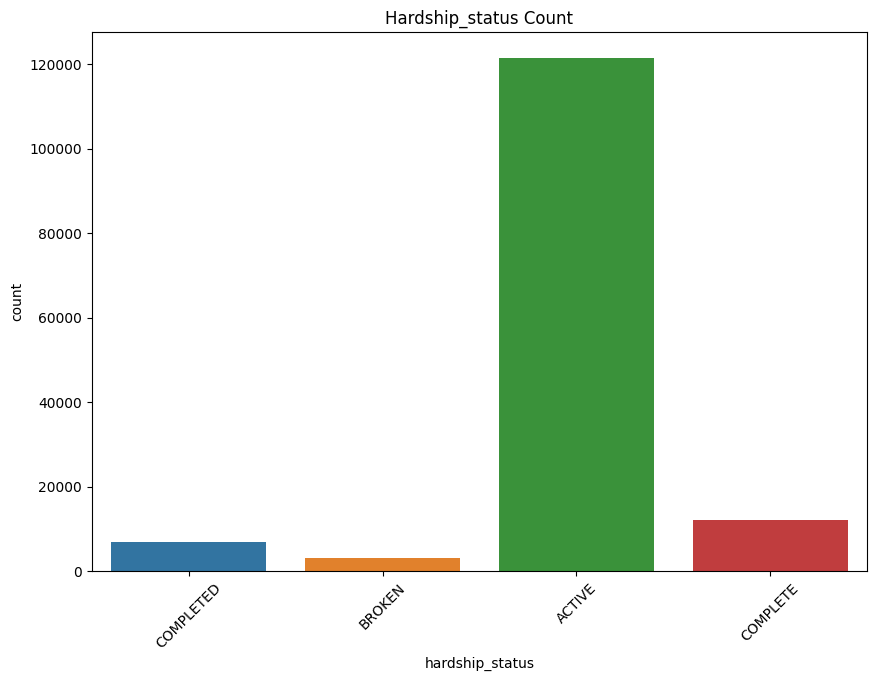

<Figure size 640x480 with 0 Axes>

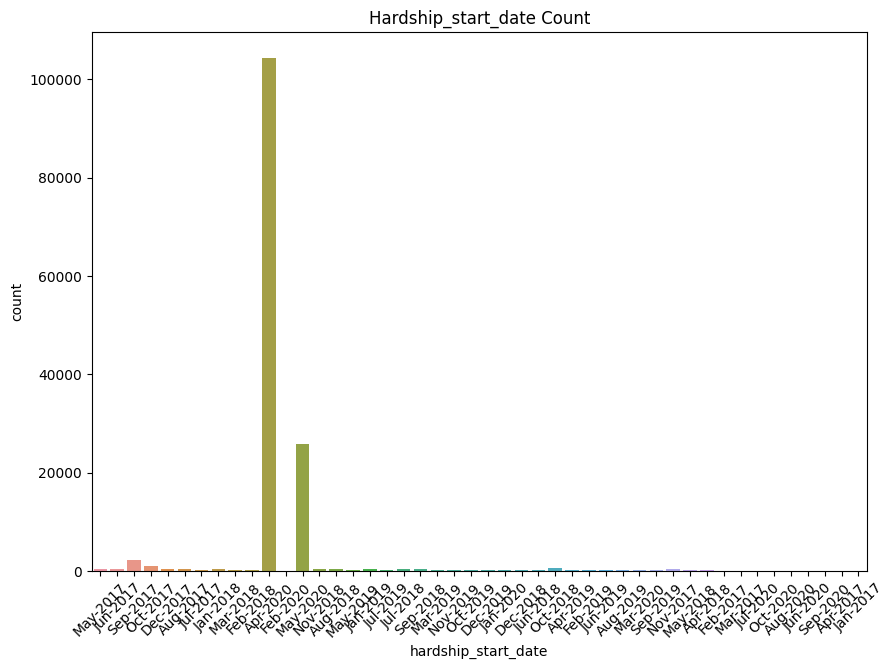

<Figure size 640x480 with 0 Axes>

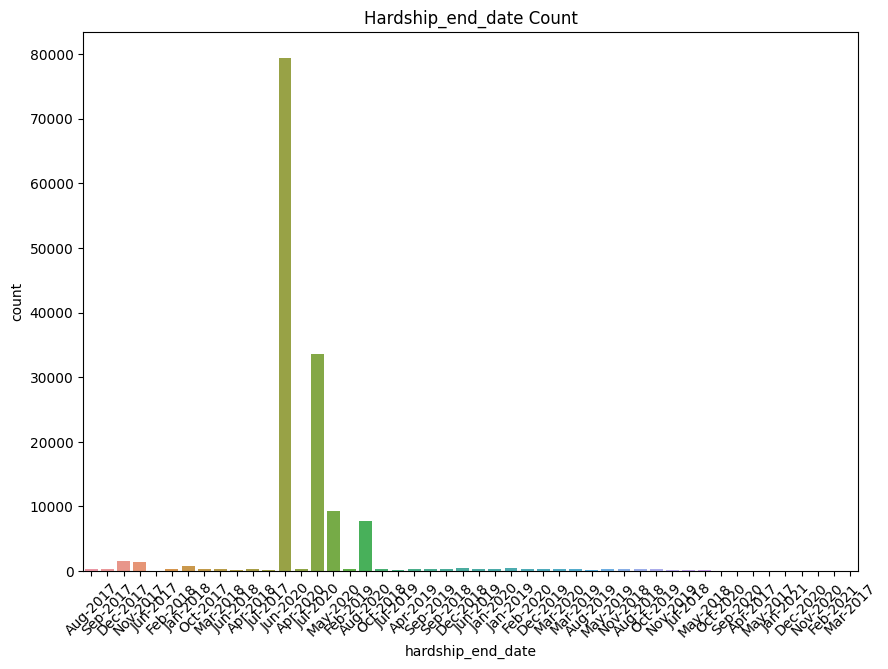

<Figure size 640x480 with 0 Axes>

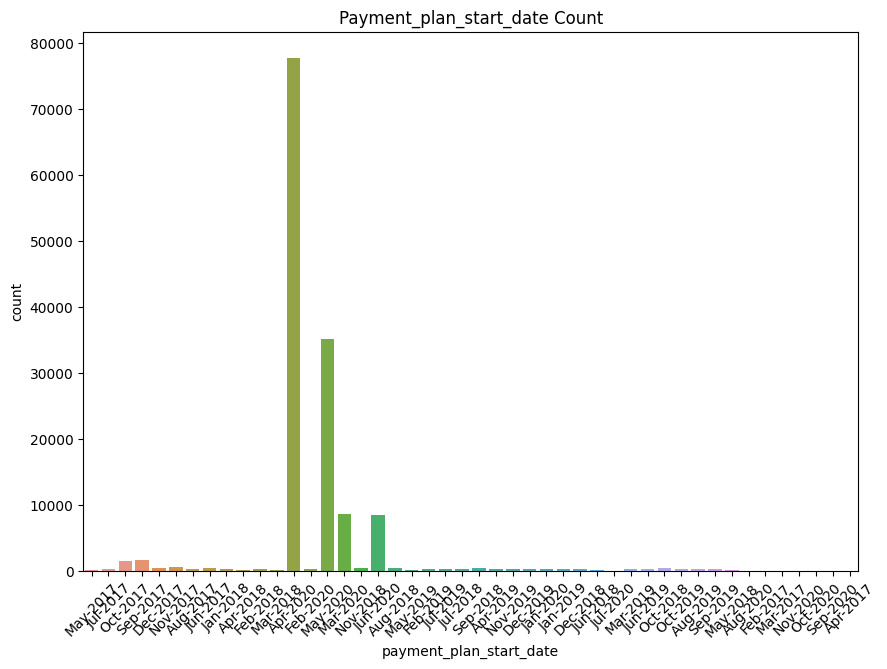

<Figure size 640x480 with 0 Axes>

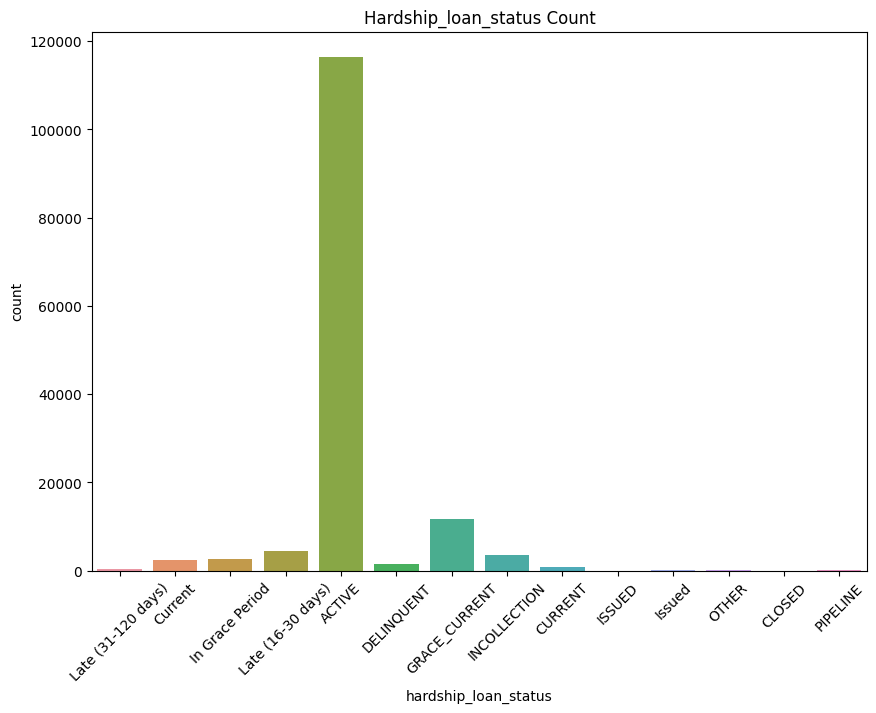

<Figure size 640x480 with 0 Axes>

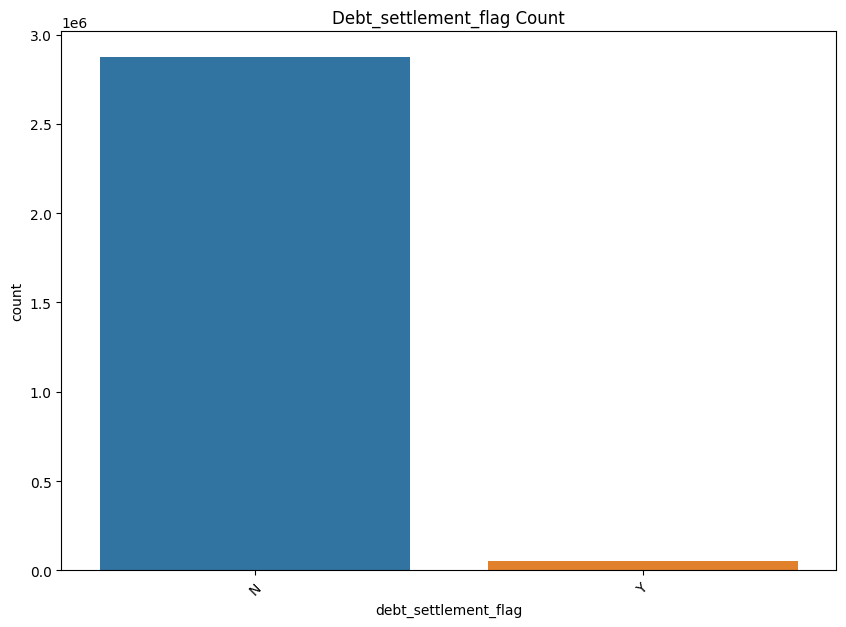

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt
cat_features = ['term',  'grade', 'sub_grade', 'emp_length', 'home_ownership', 'verification_status', 'loan_status', 
                'purpose', 'addr_state',  'initial_list_status', 
                 'application_type', 'verification_status_joint', 'hardship_flag', 'hardship_type', 
                'hardship_reason', 'hardship_status', 'hardship_start_date', 'hardship_end_date', 'payment_plan_start_date', 'hardship_loan_status', 'debt_settlement_flag']

for feature in cat_features:
    plt.figure()
    plt.figure(figsize=(10, 7))
    sns.countplot(data=loans, x=feature)
    plt.title(feature.capitalize() + ' Count')
    plt.xticks(rotation=45)
    plt.show()


In [16]:
# All Missing Values
print('Feature names, Missing values, and Percentage of missing values:')
print('______________________________________________\n\n')

total_rows = len(loans)

for column in loans.columns:
    missing_count = loans[column].isnull().sum()
    missing_percentage = (missing_count / total_rows) * 100
    print(f"{column} --> {missing_count} missing values ({missing_percentage:.2f}%)")

    

Feature names, Missing values, and Percentage of missing values:
______________________________________________


Unnamed: 0 --> 0 missing values (0.00%)
id --> 0 missing values (0.00%)
loan_amnt --> 1 missing values (0.00%)
funded_amnt --> 1 missing values (0.00%)
funded_amnt_inv --> 1 missing values (0.00%)
term --> 1 missing values (0.00%)
int_rate --> 1 missing values (0.00%)
installment --> 1 missing values (0.00%)
grade --> 1 missing values (0.00%)
sub_grade --> 1 missing values (0.00%)
emp_title --> 264087 missing values (9.03%)
emp_length --> 205221 missing values (7.01%)
home_ownership --> 1 missing values (0.00%)
annual_inc --> 5 missing values (0.00%)
verification_status --> 1 missing values (0.00%)
issue_d --> 1 missing values (0.00%)
loan_status --> 1 missing values (0.00%)
pymnt_plan --> 1 missing values (0.00%)
url --> 1 missing values (0.00%)
purpose --> 1 missing values (0.00%)
title --> 23327 missing values (0.80%)
zip_code --> 2 missing values (0.00%)
addr_state --> 

**Remove features with more than 50% missing values**

In [8]:
# Calculate missing value percentages
missing_percentages = loans.isnull().mean() * 100

for column, missing_percentage in missing_percentages.items():
    print(f"{column} --> {loans[column].isnull().sum()} missing values ({missing_percentage:.2f}%)")

# Identify columns with more than 50% missing values
columns_to_drop = missing_percentages[missing_percentages > 50].index.tolist()

# Remove columns with more than 50% missing values
loans = loans.drop(columns=columns_to_drop)

# Display the filtered DataFrame
print("\n\nDataFrame after removing columns with more than 50% missing values:")
print(loans.head())

Unnamed: 0 --> 0 missing values (0.00%)
id --> 0 missing values (0.00%)
loan_amnt --> 1 missing values (0.00%)
funded_amnt --> 1 missing values (0.00%)
funded_amnt_inv --> 1 missing values (0.00%)
term --> 1 missing values (0.00%)
int_rate --> 1 missing values (0.00%)
installment --> 1 missing values (0.00%)
grade --> 1 missing values (0.00%)
sub_grade --> 1 missing values (0.00%)
emp_title --> 264087 missing values (9.03%)
emp_length --> 205221 missing values (7.01%)
home_ownership --> 1 missing values (0.00%)
annual_inc --> 5 missing values (0.00%)
verification_status --> 1 missing values (0.00%)
issue_d --> 1 missing values (0.00%)
loan_status --> 1 missing values (0.00%)
pymnt_plan --> 1 missing values (0.00%)
url --> 1 missing values (0.00%)
purpose --> 1 missing values (0.00%)
title --> 23327 missing values (0.80%)
zip_code --> 2 missing values (0.00%)
addr_state --> 1 missing values (0.00%)
dti --> 3109 missing values (0.11%)
delinq_2yrs --> 30 missing values (0.00%)
earliest_cr

**107 columns remain**

In [7]:
loans.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2925493 entries, 0 to 2925492
Columns: 107 entries, Unnamed: 0 to debt_settlement_flag
dtypes: float64(81), int64(1), object(25)
memory usage: 2.3+ GB


In [9]:
pip install scikit-learn skrebate


  Preparing metadata (setup.py) ... done
  Created wheel for skrebate: filename=skrebate-0.62-py3-none-any.whl size=29253 sha256=f82b70bcb88b06ae27510351227290b691ffb7cf31fb2e82a3c5ef81c5d33ae9
  Stored in directory: /root/.cache/pip/wheels/dd/67/40/683074a684607162bd0e34dcf7ccdfcab5861c3b2a83286f3a
Successfully built skrebate

[notice] A new release of pip is available: 23.0.1 -> 24.0
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


**Relief feature evaluator (RefilefFE)**

In [10]:
pip install xgboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.1/297.1 MB 2.7 MB/s eta 0:00:0000:0100:01

[notice] A new release of pip is available: 23.0.1 -> 24.0
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [11]:
import pandas as pd
from skrebate import ReliefF
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report


# Separate features (X) and target (y)
X = loans.drop(columns=['loan_status'])  
y = loans['loan_status']

X.drop('id', axis=1, inplace=True)
X.drop('Unnamed: 0', axis=1, inplace=True)
X.drop('url', axis=1, inplace=True)
X.drop('zip_code', axis=1, inplace=True)
X.drop('addr_state', axis=1, inplace=True)
X.drop('emp_title', axis=1, inplace=True)
X.drop('title', axis=1, inplace=True)


In [12]:
X['term'].fillna('', inplace=True) 


def extract_numeric(term):
    if isinstance(term, str):
        term = term.strip()  
        if term.endswith(' months'):
            term = term[:-len(' months')]  
        numeric_part = ''.join(filter(str.isdigit, term))  
        if numeric_part:
            return int(numeric_part)
    return None


X['term'] = X['term'].apply(extract_numeric)

def remove_percentage(value):
    if isinstance(value, str) and value.endswith('%'):
        return float(value[:-1]) 
    else:
        return None  


X['revol_util'] = X['revol_util'].apply(remove_percentage)
X['int_rate'] = X['int_rate'].apply(remove_percentage)



date_format = '%b-%Y'  # Example format: Month ( Jan) - Year ( 2015)

# Convert date features to datetime format
X['last_credit_pull_d'] = pd.to_datetime(X['last_credit_pull_d'], format=date_format)
X['last_pymnt_d'] = pd.to_datetime(X['last_pymnt_d'], format=date_format)
X['issue_d'] = pd.to_datetime(X['issue_d'], format=date_format)
X['earliest_cr_line'] = pd.to_datetime(X['earliest_cr_line'], format=date_format)


emp_length_mapping = {
    '10+ years': 10,
    '9 years': 9,
    '8 years': 8,
    '7 years': 7,
    '6 years': 6,
    '5 years': 5,
    '4 years': 4,
    '3 years': 3,
    '2 years': 2,
    '1 year': 1,
    '< 1 year': 0.5,  
    ' ': 0  
}

# Apply the mapping to convert emp_length to numerical values
X['emp_length'] = X['emp_length'].map(emp_length_mapping)



ordinal_features = ['grade', 'sub_grade', 'home_ownership', 'verification_status', 'pymnt_plan', 'purpose', 'application_type', 'hardship_flag','debt_settlement_flag']

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Apply LabelEncoder to ordinal categorical features
for feature in ordinal_features:
    X[feature] = label_encoder.fit_transform(X[feature])
    
    


# Function to convert non-datetime features to integer
def convert_to_integer(value):
    try:
        return int(value)  # Try converting to integer directly
    except (ValueError, TypeError):
        return None  # Return None for non-convertible values

# Identify datetime columns (timestamp columns)
datetime_columns = [col for col in X.columns if pd.api.types.is_datetime64_any_dtype(X[col])]

# Apply conversion function to non-datetime columns
for column in X.columns:
    if column not in datetime_columns:
        X[column] = X[column].apply(convert_to_integer)

# Use LabelEncoder for categorical features (e.g., feature2)
label_encoder = LabelEncoder()
for column in X.columns:
    if column not in datetime_columns and X[column].dtype == 'object':
        X[column] = label_encoder.fit_transform(X[column])
        

        
        
datetime_columns = ['last_credit_pull_d', 'last_pymnt_d', 'issue_d', 'earliest_cr_line']

reference_date = pd.Timestamp('2024-04-22')

for col in datetime_columns:
    X[col] = (reference_date - X[col]).dt.days
X.fillna(X.mean(), inplace=True)

**Convert into integer**

In [13]:
pd.set_option('display.max_columns', None)
X.head(10)


,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,pymnt_plan,purpose,dti,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_inq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,hardship_flag,debt_settlement_flag
0,5000.0,5000.0,4975.0,36.0,10.0,162.0,1,6,10.0,5,24000.0,2,4526.0,0,1,27.0,0.0,14356.0,735.0,739.0,1.0,3.0,0.0,13648.0,83.0,9.0,0,0.0,0.0,5863.0,5833.0,5000.0,863.0,0.0,0.0,0.0,3399.0,171.0,1452.0,704.0,700.0,0.0,1.0,0,0.0,216.882722,145377.339755,0.93124,2.826787,0.698881,1.603937,20.40308,36835.366107,68.963711,1.253812,2.64574,6018.203809,56.278664,36338.643163,1.071141,1.517789,2.001608,4.490981,13712.209752,12682.044322,55.493868,0.0,0.0,125.902634,179.697409,14.460248,8.345006,1.512336,25.069785,7.108003,0.488058,3.706979,5.607187,4.855647,7.621204,8.531872,8.268738,13.779913,5.563515,11.686031,0.00049,0.002173,0.07688,2.071412,94.103108,39.944715,0.0,0.0,183243.623773,52657.698503,24764.713408,45431.610711,0,0
1,2500.0,2500.0,2500.0,60.0,15.0,59.0,2,13,0.0,5,30000.0,1,4526.0,0,0,1.0,0.0,9153.0,740.0,744.0,5.0,3.0,0.0,1687.0,9.0,4.0,0,0.0,0.0,1014.0,1014.0,456.0,435.0,0.0,122.0,1.0,4039.0,119.0,2760.0,499.0,0.0,0.0,1.0,0,0.0,216.882722,145377.339755,0.93124,2.826787,0.698881,1.603937,20.40308,36835.366107,68.963711,1.253812,2.64574,6018.203809,56.278664,36338.643163,1.071141,1.517789,2.001608,4.490981,13712.209752,12682.044322,55.493868,0.0,0.0,125.902634,179.697409,14.460248,8.345006,1.512336,25.069785,7.108003,0.488058,3.706979,5.607187,4.855647,7.621204,8.531872,8.268738,13.779913,5.563515,11.686031,0.00049,0.002173,0.07688,2.071412,94.103108,39.944715,0.0,0.0,183243.623773,52657.698503,24764.713408,45431.610711,0,0
2,2400.0,2400.0,2400.0,36.0,15.0,84.0,2,14,10.0,5,12252.0,0,4526.0,0,11,8.0,0.0,8208.0,735.0,739.0,2.0,2.0,0.0,2956.0,98.0,10.0,0,0.0,0.0,3005.0,3005.0,2400.0,605.0,0.0,0.0,0.0,3613.0,649.0,2517.0,739.0,735.0,0.0,1.0,0,0.0,216.882722,145377.339755,0.93124,2.826787,0.698881,1.603937,20.40308,36835.366107,68.963711,1.253812,2.64574,6018.203809,56.278664,36338.643163,1.071141,1.517789,2.001608,4.490981,13712.209752,12682.044322,55.493868,0.0,0.0,125.902634,179.697409,14.460248,8.345006,1.512336,25.069785,7.108003,0.488058,3.706979,5.607187,4.855647,7.621204,8.531872,8.268738,13.779913,5.563515,11.686031,0.00049,0.002173,0.07688,2.071412,94.103108,39.944715,0.0,0.0,183243.623773,52657.698503,24764.713408,45431.610711,0,0
3,10000.0,10000.0,10000.0,36.0,13.0,339.0,2,10,10.0,5,49200.0,1,4526.0,0,9,20.0,0.0,10308.0,690.0,694.0,1.0,10.0,0.0,5598.0,21.0,37.0,0,0.0,0.0,12231.0,12231.0,10000.0,2214.0,16.0,0.0,0.0,3399.0,357.0,2943.0,604.0,600.0,0.0,1.0,0,0.0,216.882722,145377.339755,0.93124,2.826787,0.698881,1.603937,20.40308,36835.366107,68.963711,1.253812,2.64574,6018.203809,56.278664,36338.643163,1.071141,1.517789,2.00160

In [22]:
y

array([5, 0, 5, ..., 0, 5, 0])

In [ ]:
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

In [ ]:

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Apply ReliefF feature selection
relief = ReliefF(n_features_to_select=40, n_neighbors=100)
relief.fit(X_train.values, y_train)




In [ ]:
# Get selected feature indices
selected_feature_indices = relief.top_features_

# Subset the features based on ReliefF selection
X_train_selected = X_train.iloc[:, selected_feature_indices]
X_test_selected = X_test.iloc[:, selected_feature_indices]


# models to train
models = {
    'Logistic Regression': LogisticRegression(),
    'Random Forest': RandomForestClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
    'XGBoost': XGBClassifier(),
    'SVM': SVC()
}

results = {}

for name, model in models.items():
    model.fit(X_train_selected, y_train)
    y_pred = model.predict(X_test_selected)
    accuracy = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred)
    results[name] = {'accuracy': accuracy, 'classification_report': report}

# results

for name, result in results.items():
    print(f"Model: {name}")
    print(f"Accuracy: {result['accuracy']:.4f}")
    print(f"Classification Report:\n{result['classification_report']}\n")

**Only Model**

In [23]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# models to train
models = {
    'Logistic Regression': LogisticRegression(),
    'Random Forest': RandomForestClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
    'XGBoost': XGBClassifier(),
    'SVM': SVC()
}

results = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred)
    results[name] = {'accuracy': accuracy, 'classification_report': report}

# results

for name, result in results.items():
    print(f"Model: {name}")
    print(f"Accuracy: {result['accuracy']:.4f}")
    print(f"Classification Report:\n{result['classification_report']}\n")

/usr/local/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels wit

KeyboardInterrupt: 

**IGNORE**

In [19]:
# Create another Dataframe with the Null values bigger then 1 Lakh Data
    
columns_with_nulls = loans.columns[loans.isnull().sum() > 100000].tolist()
missing_values_df = loans[columns_with_nulls]

for col in missing_values_df: 
    print(col)
    
num_features = missing_values_df.shape[1]

print("\n\n Number of feature names (columns):", num_features)

emp_title
emp_length
mths_since_last_delinq
mths_since_last_record
next_pymnt_d
mths_since_last_major_derog
annual_inc_joint
dti_joint
verification_status_joint
open_acc_6m
open_act_il
open_il_12m
open_il_24m
mths_since_rcnt_il
total_bal_il
il_util
open_rv_12m
open_rv_24m
max_bal_bc
all_util
inq_fi
total_cu_tl
inq_last_12m
mo_sin_old_il_acct
mths_since_recent_bc_dlq
mths_since_recent_inq
mths_since_recent_revol_delinq
num_tl_120dpd_2m
revol_bal_joint
sec_app_fico_range_low
sec_app_fico_range_high
sec_app_earliest_cr_line
sec_app_inq_last_6mths
sec_app_mort_acc
sec_app_open_acc
sec_app_revol_util
sec_app_open_act_il
sec_app_num_rev_accts
sec_app_chargeoff_within_12_mths
sec_app_collections_12_mths_ex_med
hardship_type
hardship_reason
hardship_status
deferral_term
hardship_amount
hardship_start_date
hardship_end_date
payment_plan_start_date
hardship_length
hardship_dpd
hardship_loan_status
orig_projected_additional_accrued_interest
hardship_payoff_balance_amount
hardship_last_payment_amo

In [19]:
merged_df = pd.concat([missing_values_df, loans['loan_status']], axis=1)

In [20]:
pd.options.display.max_columns = None
merged_df.head(15)

,emp_title,emp_length,mths_since_last_delinq,mths_since_last_record,next_pymnt_d,mths_since_last_major_derog,annual_inc_joint,dti_joint,verification_status_joint,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,inq_fi,total_cu_tl,inq_last_12m,mo_sin_old_il_acct,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_tl_120dpd_2m,revol_bal_joint,sec_app_fico_range_low,sec_app_fico_range_high,sec_app_earliest_cr_line,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,hardship_type,hardship_reason,hardship_status,deferral_term,hardship_amount,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,loan_status
0,NaN,10+ years,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Fully Paid
1,Ryder,< 1 year,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Charged Off
2,NaN,10+ years,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Fully Paid
3,AIR RESOURCES BOARD,10+ years,35.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Fully Paid
4,University Medical Group,1 year,38.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Fully Paid
5,Veolia Transportaton,3 years,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Fully Paid
6,Southern Star Photography,8 years,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Fully Paid
7,MKC Accounting,9 years,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Fully Paid
8,NaN,4 years,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Charged Off
9,Starbucks,< 1 year,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Charged Off


In [21]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2925493 entries, 0 to 2925492
Data columns (total 55 columns):
 #   Column                                      Dtype  
---  ------                                      -----  
 0   emp_title                                   object 
 1   emp_length                                  object 
 2   mths_since_last_delinq                      float64
 3   mths_since_last_record                      float64
 4   next_pymnt_d                                object 
 5   mths_since_last_major_derog                 float64
 6   annual_inc_joint                            float64
 7   dti_joint                                   float64
 8   verification_status_joint                   object 
 9   open_acc_6m                                 float64
 10  open_act_il                                 float64
 11  open_il_12m                                 float64
 12  open_il_24m                                 float64
 13  mths_since_rcnt_il         

In [19]:
numerical_feature2 = merged_df.select_dtypes(include=['float64']).columns.tolist()
print(numerical_feature2)

['mths_since_last_delinq', 'mths_since_last_record', 'mths_since_last_major_derog', 'annual_inc_joint', 'dti_joint', 'open_acc_6m', 'open_act_il', 'open_il_12m', 'open_il_24m', 'mths_since_rcnt_il', 'total_bal_il', 'il_util', 'open_rv_12m', 'open_rv_24m', 'max_bal_bc', 'all_util', 'inq_fi', 'total_cu_tl', 'inq_last_12m', 'mo_sin_old_il_acct', 'mths_since_recent_bc_dlq', 'mths_since_recent_inq', 'mths_since_recent_revol_delinq', 'num_tl_120dpd_2m', 'revol_bal_joint', 'sec_app_fico_range_low', 'sec_app_fico_range_high', 'sec_app_inq_last_6mths', 'sec_app_mort_acc', 'sec_app_open_acc', 'sec_app_revol_util', 'sec_app_open_act_il', 'sec_app_num_rev_accts', 'sec_app_chargeoff_within_12_mths', 'sec_app_collections_12_mths_ex_med', 'deferral_term', 'hardship_amount', 'hardship_length', 'hardship_dpd', 'orig_projected_additional_accrued_interest', 'hardship_payoff_balance_amount', 'hardship_last_payment_amount']


/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


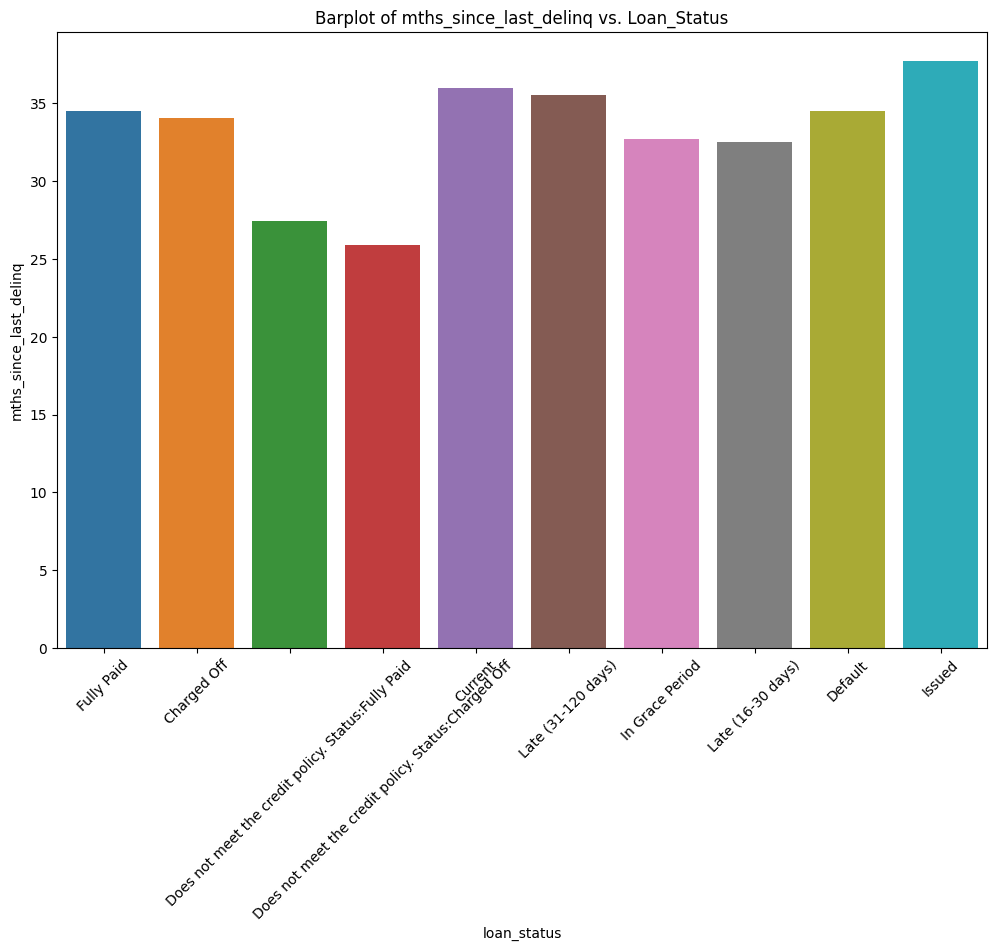

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


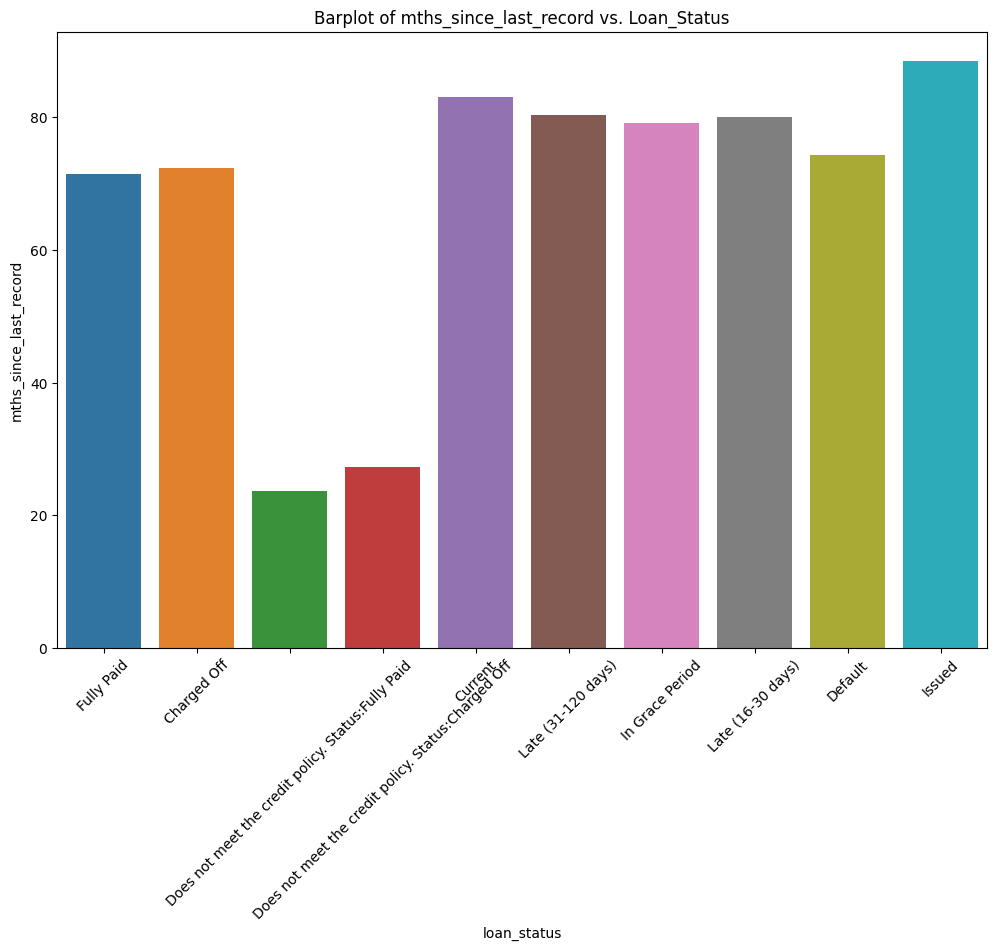

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


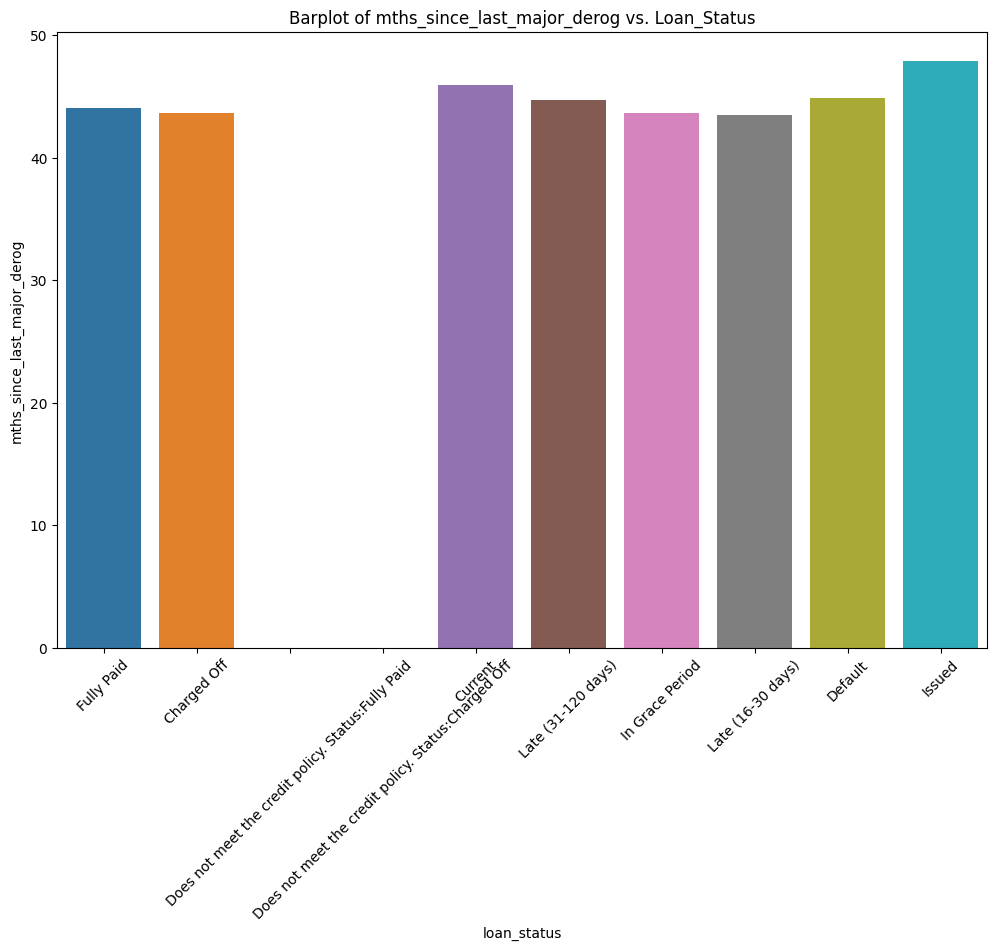

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


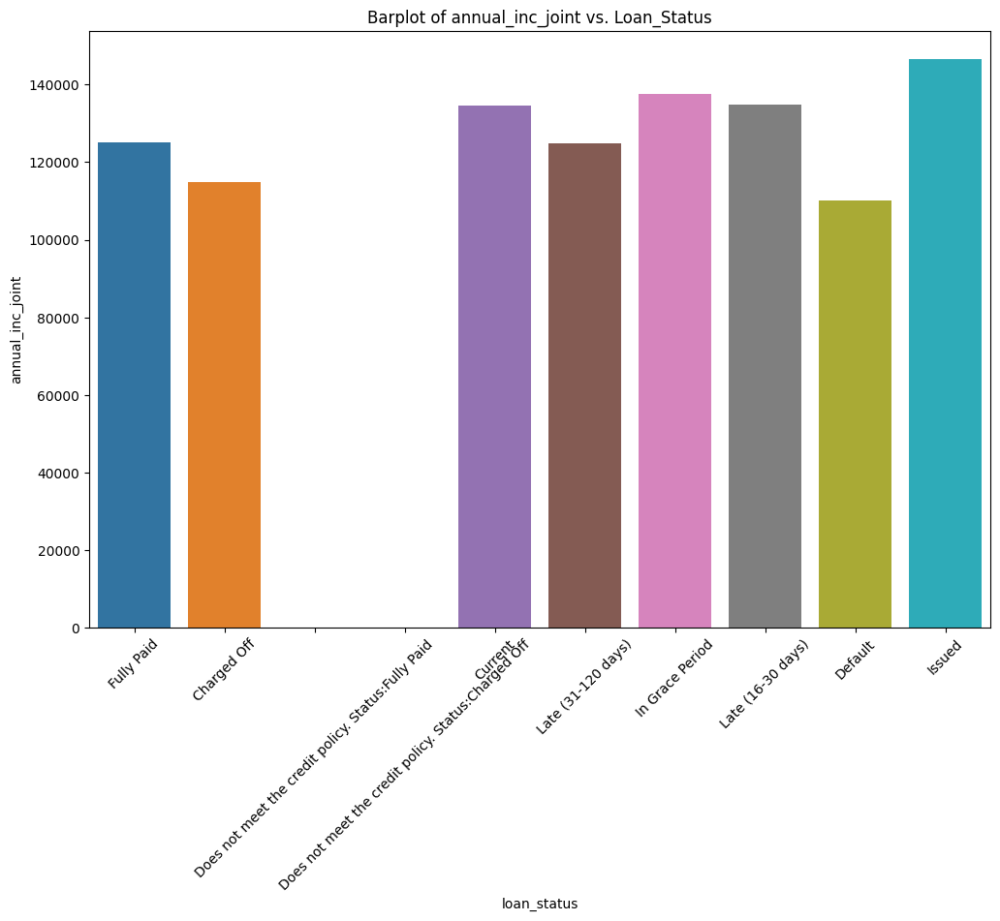

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


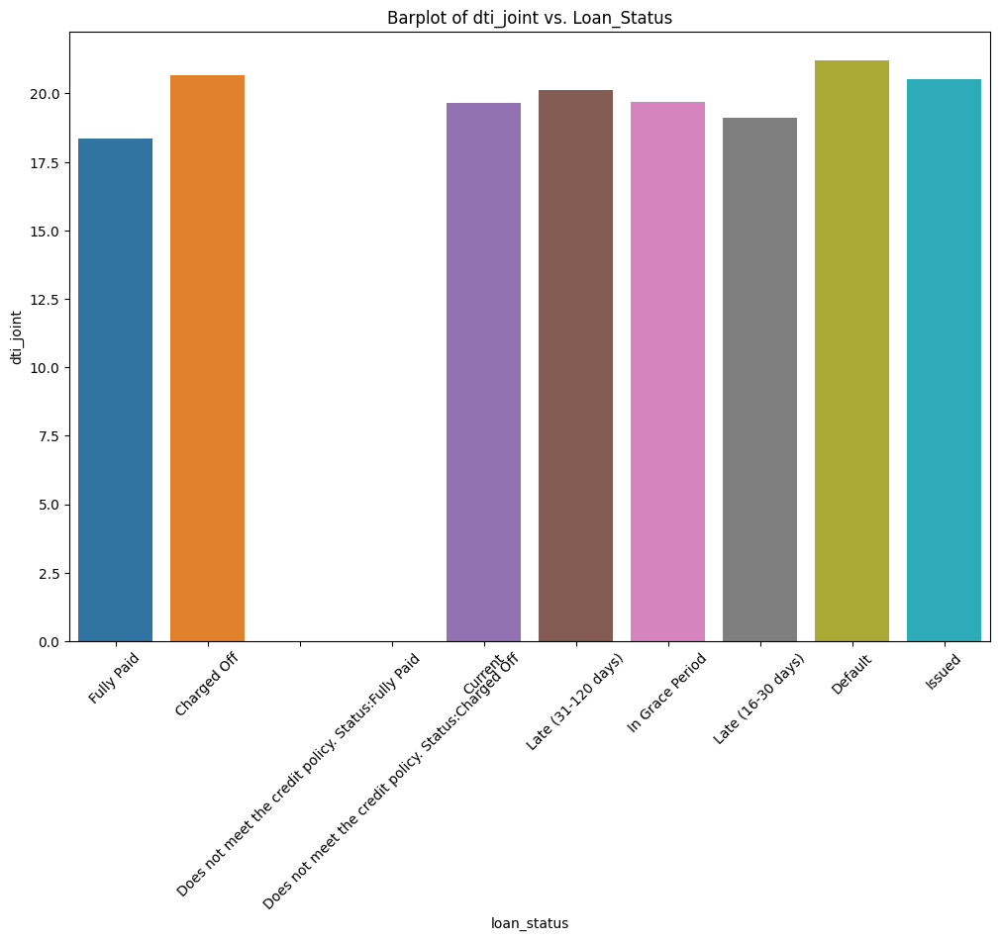

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


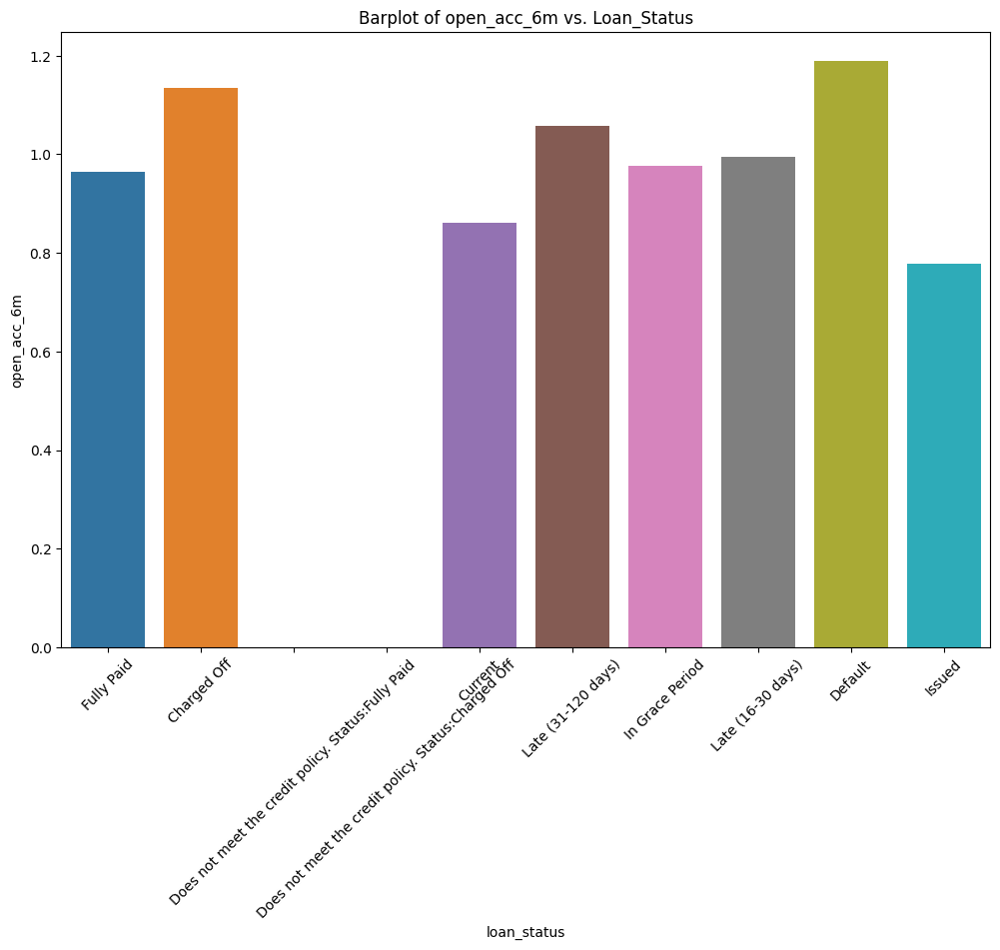

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


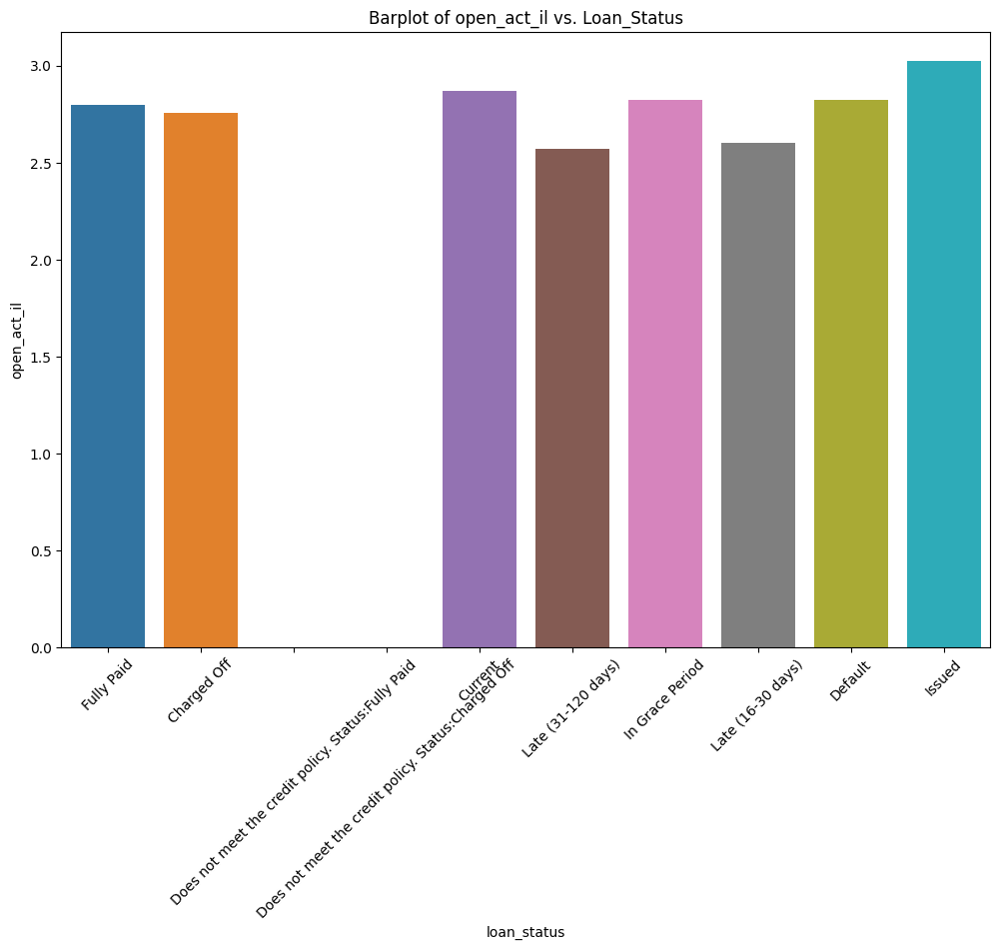

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


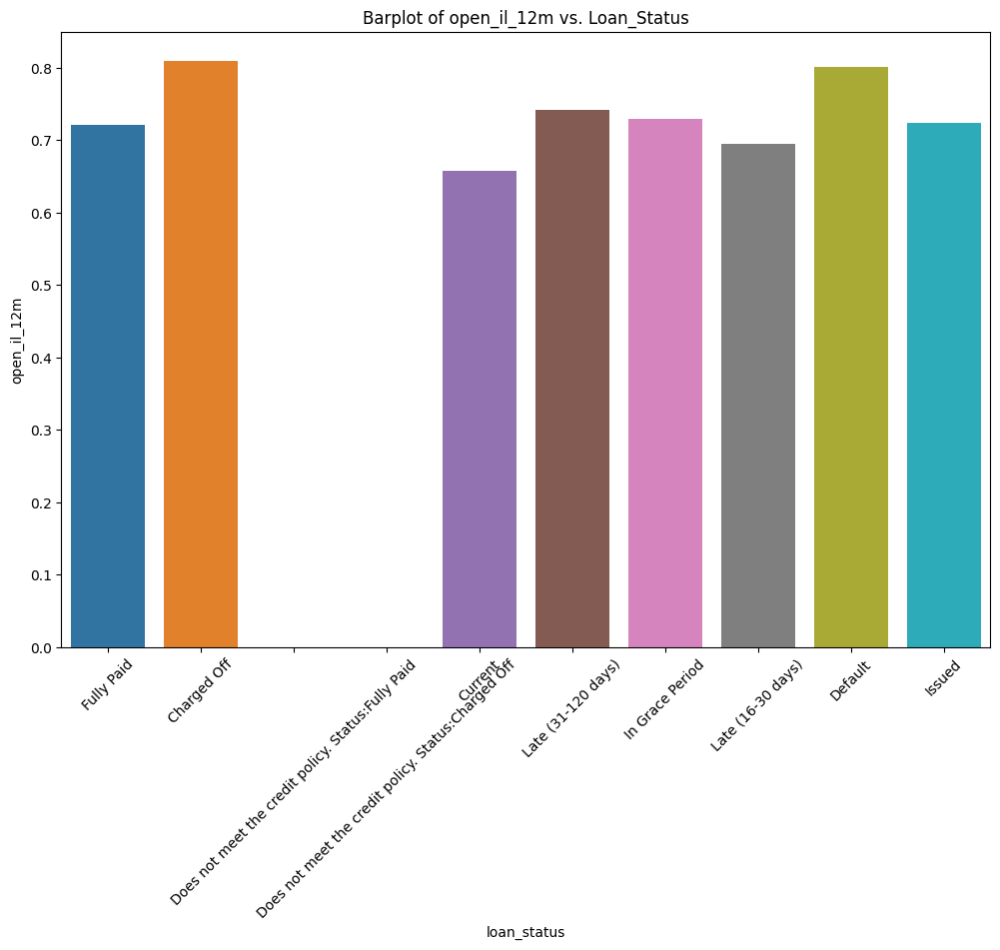

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


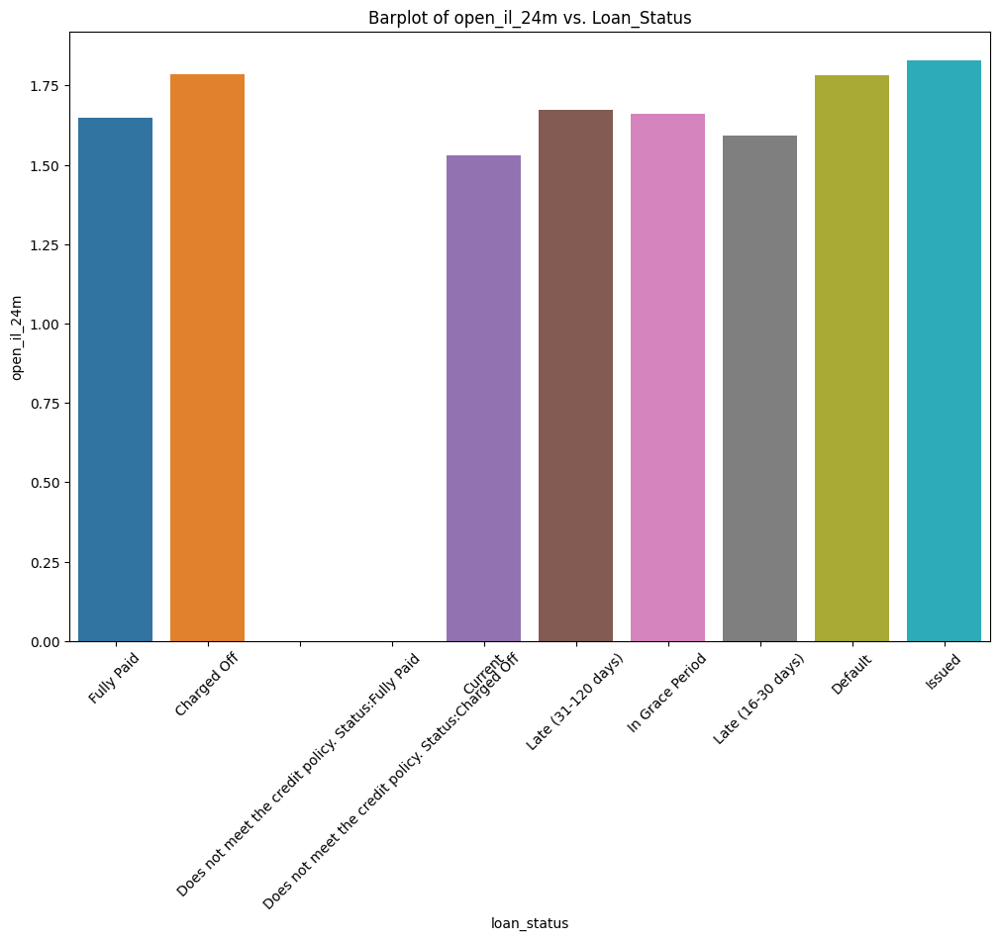

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


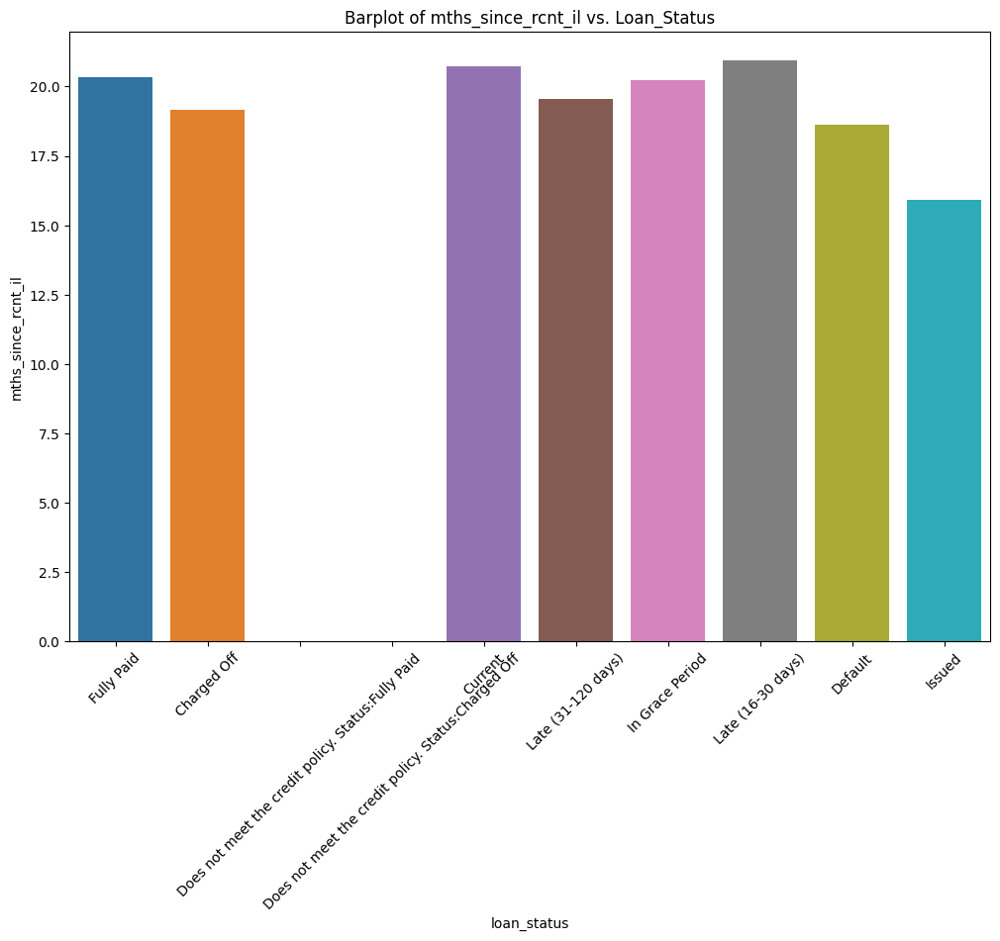

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


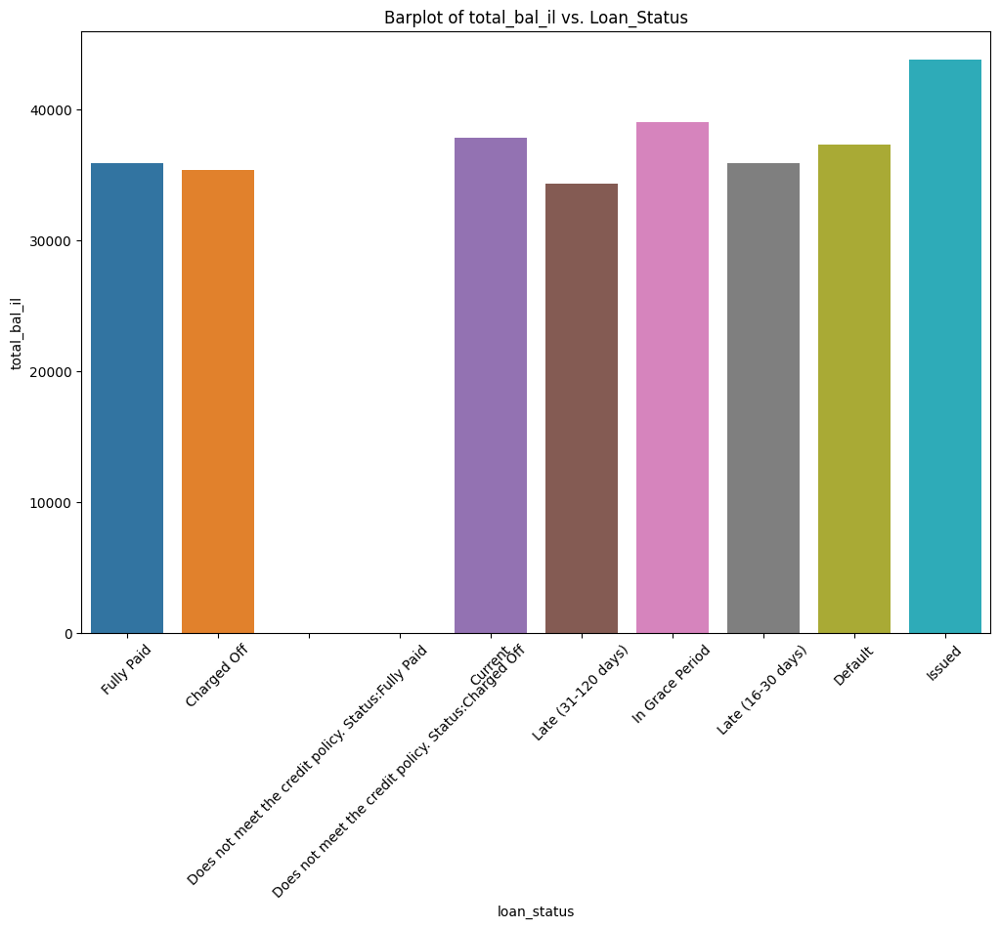

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


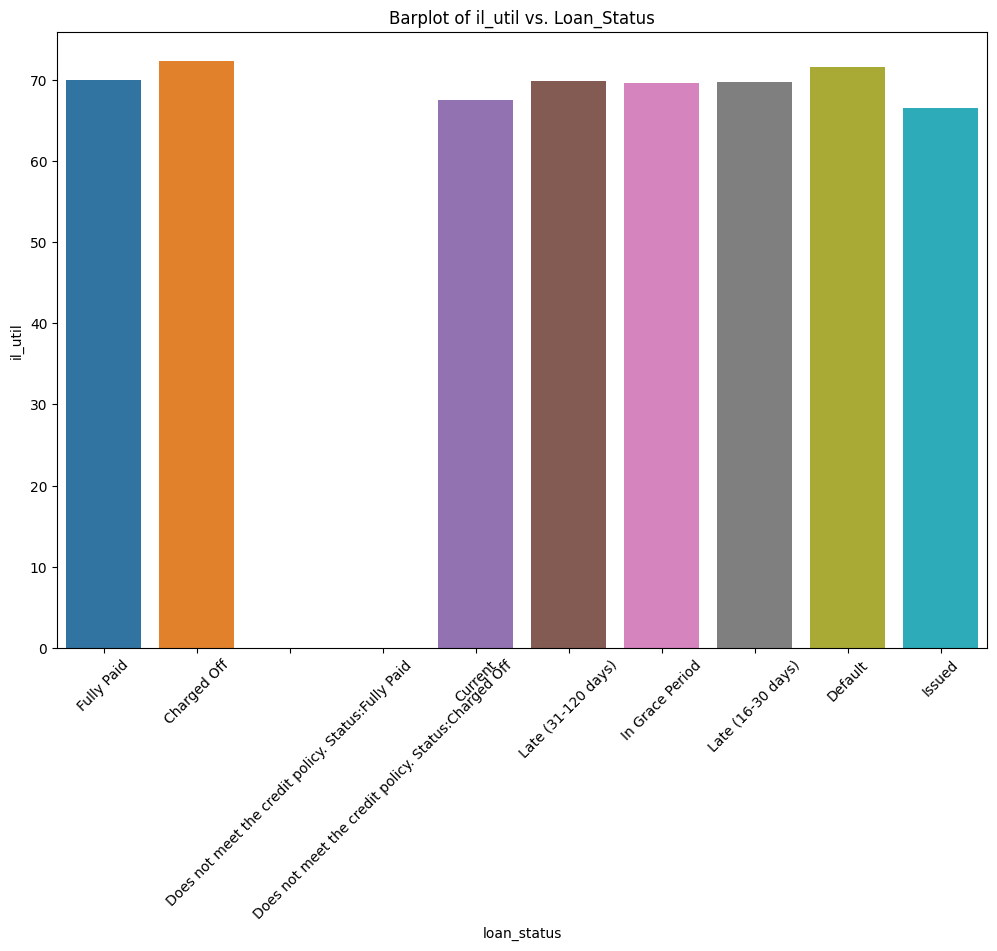

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


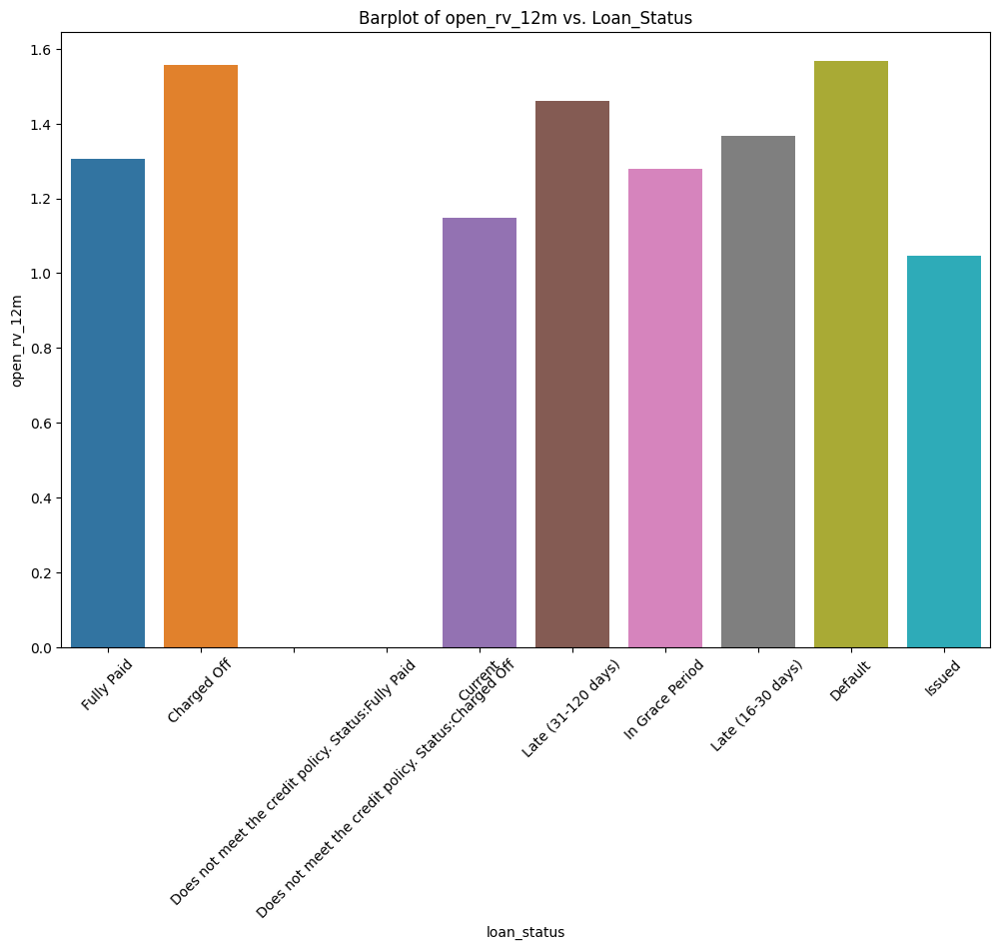

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


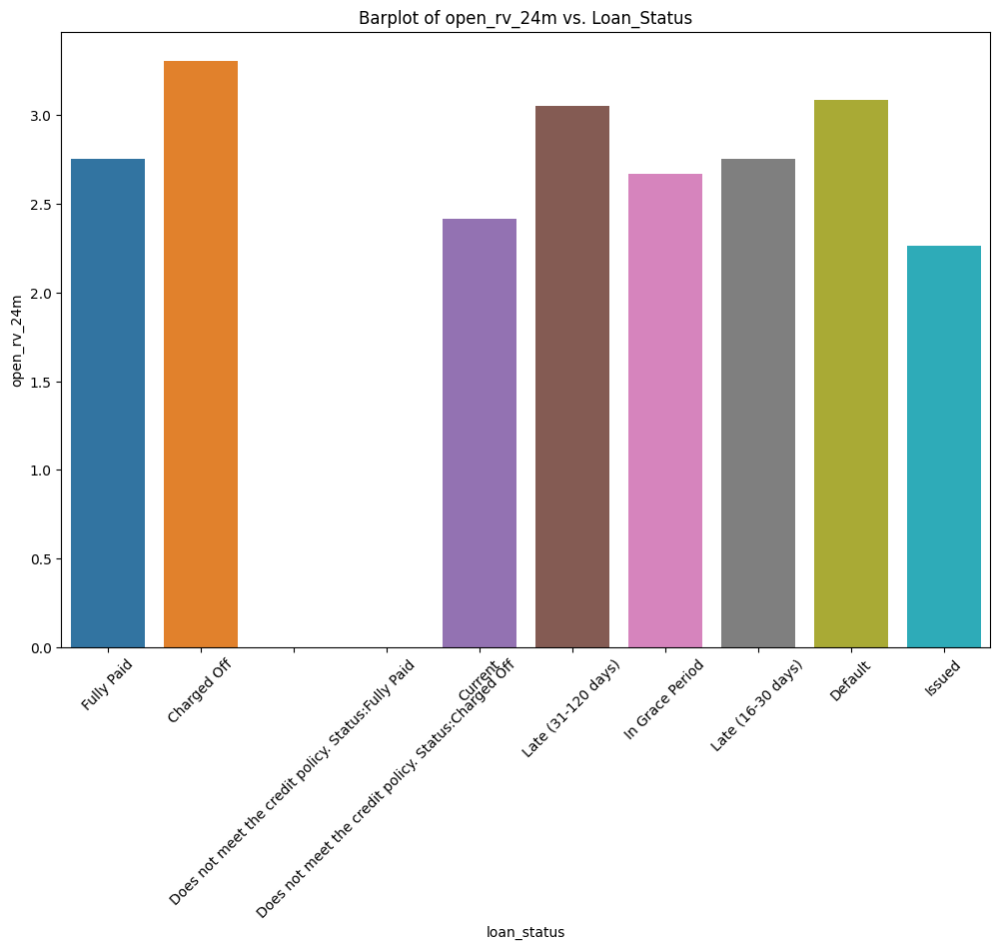

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


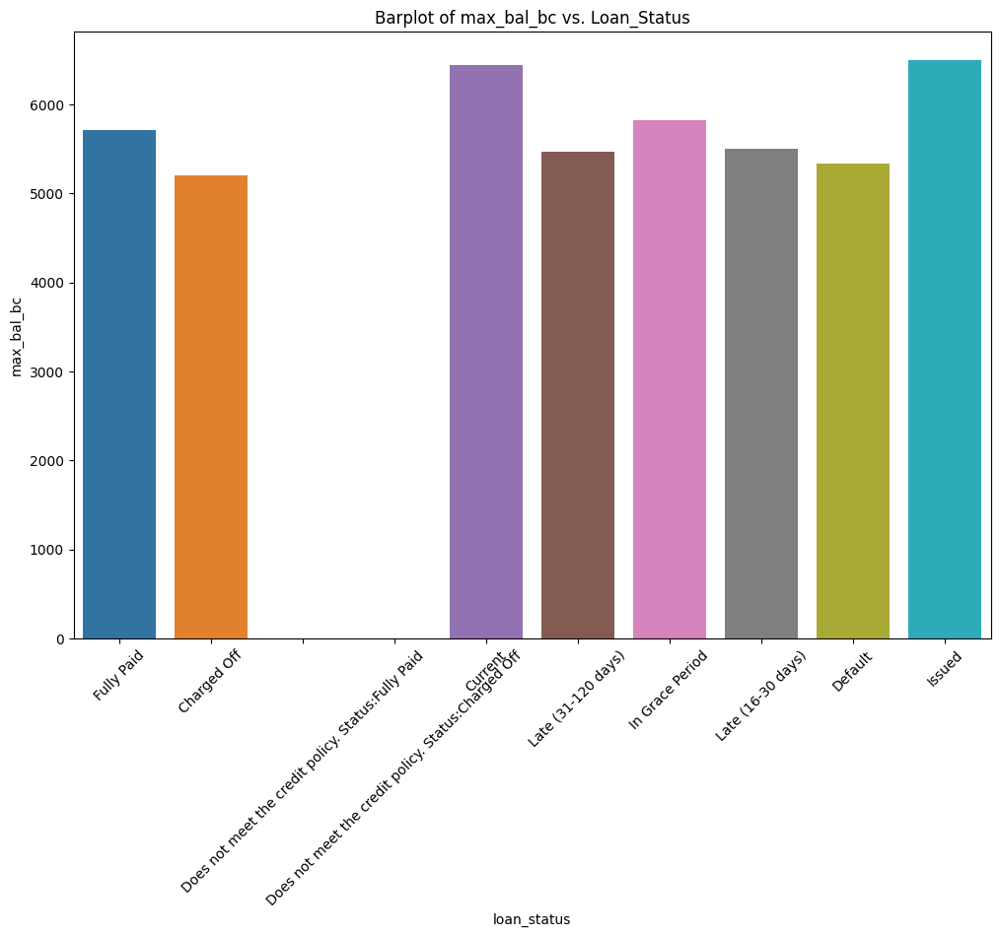

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


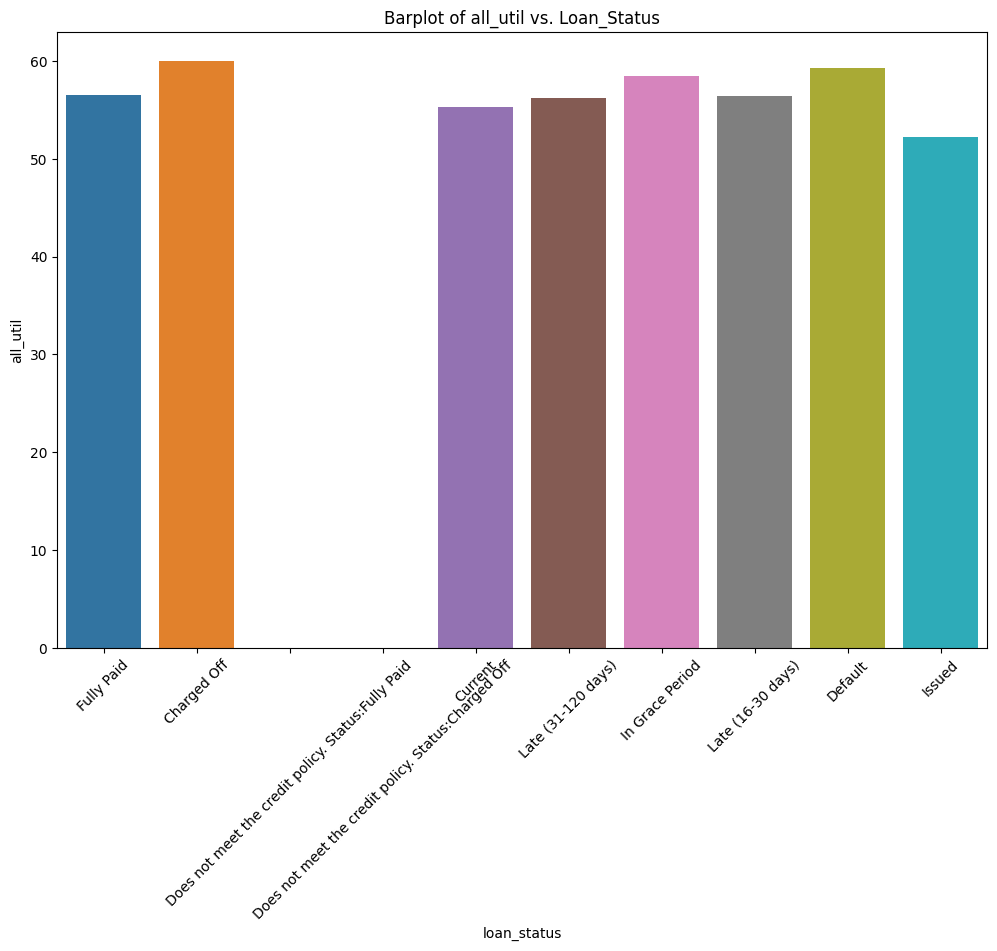

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


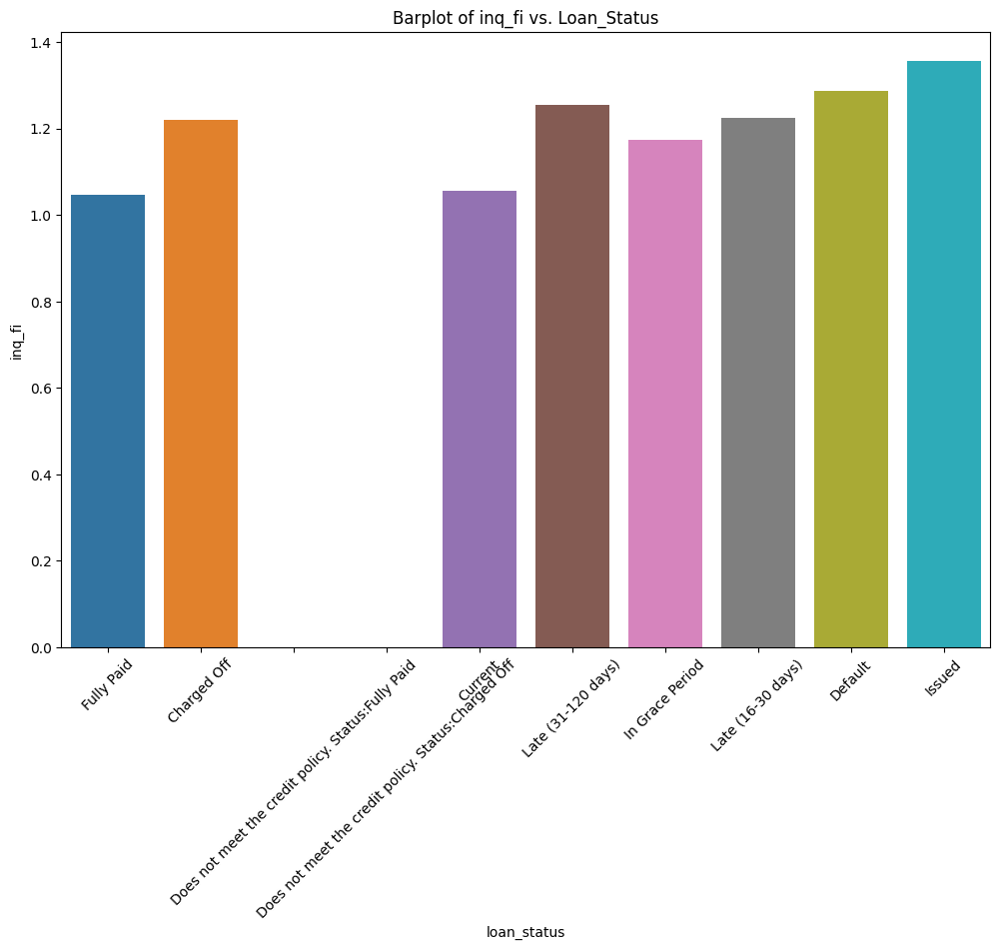

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


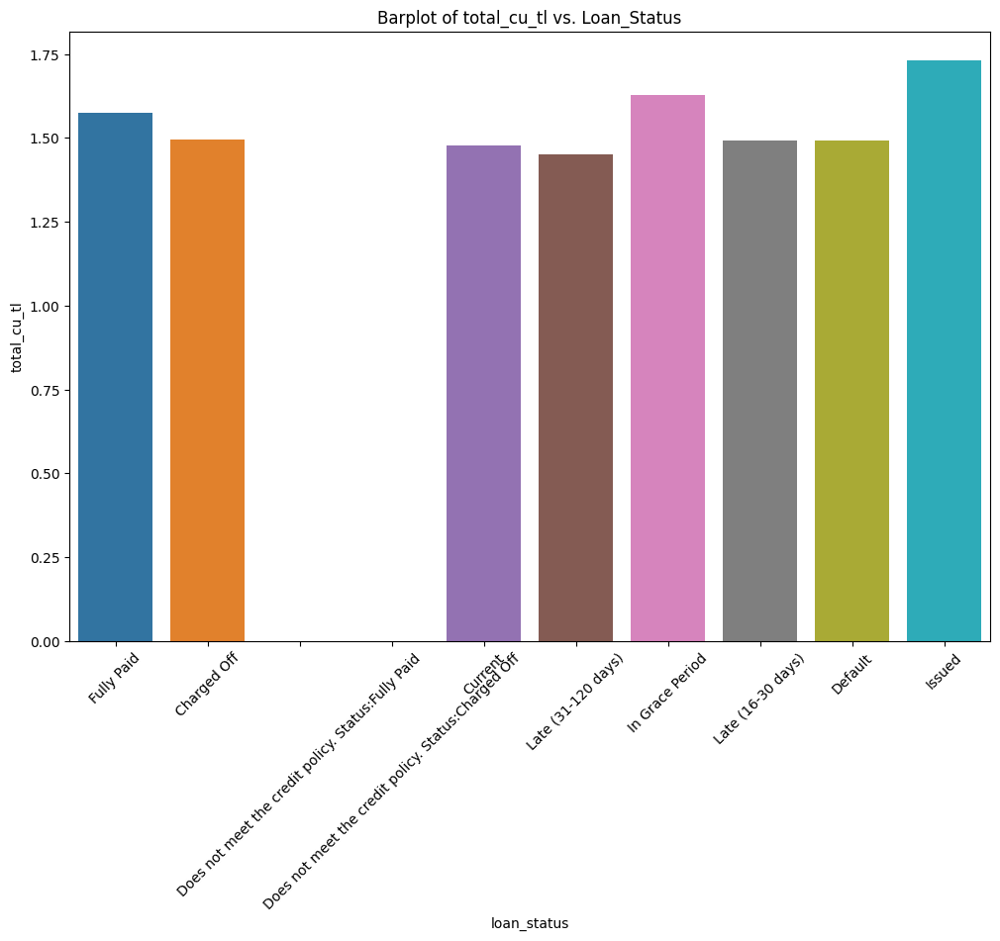

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


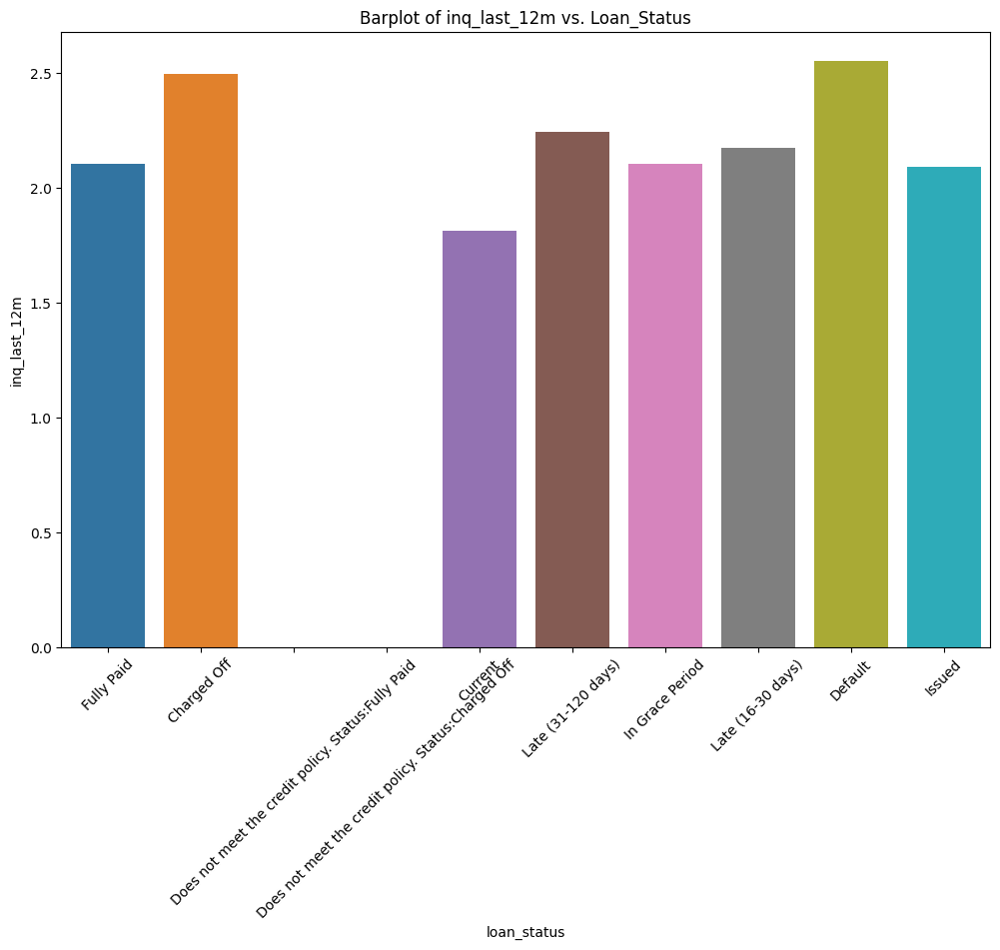

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


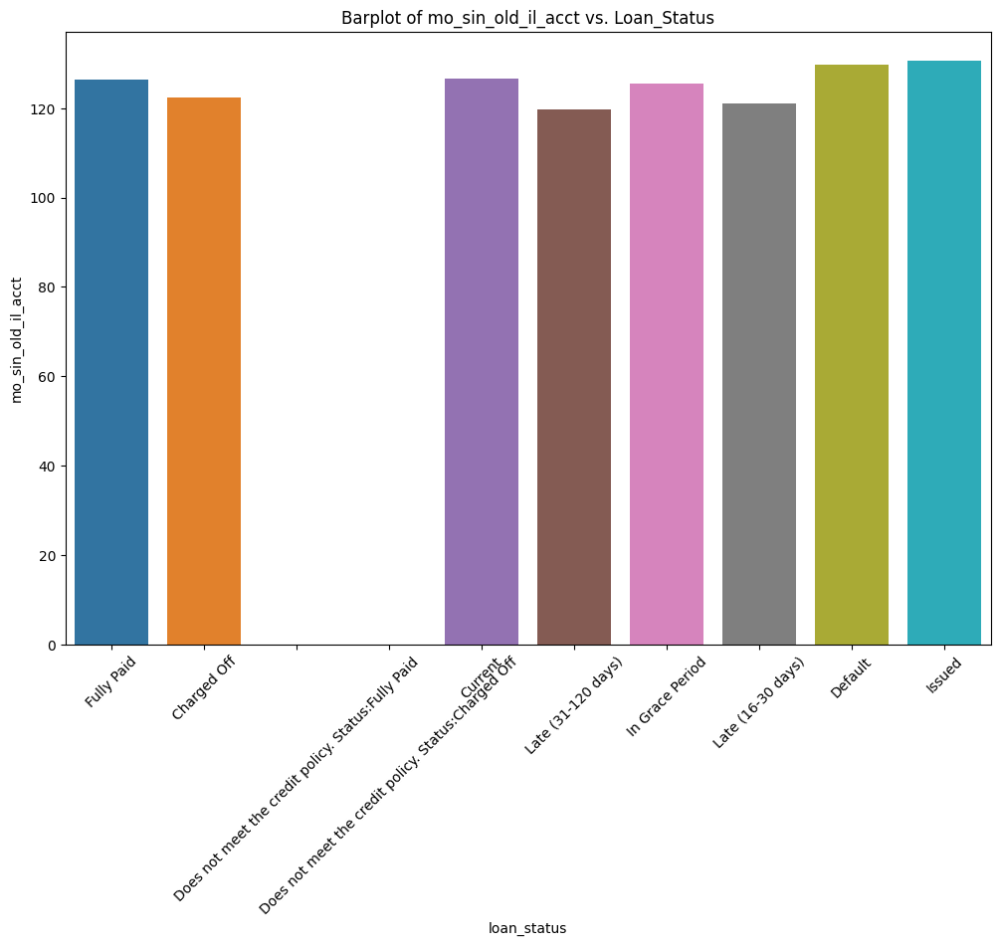

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


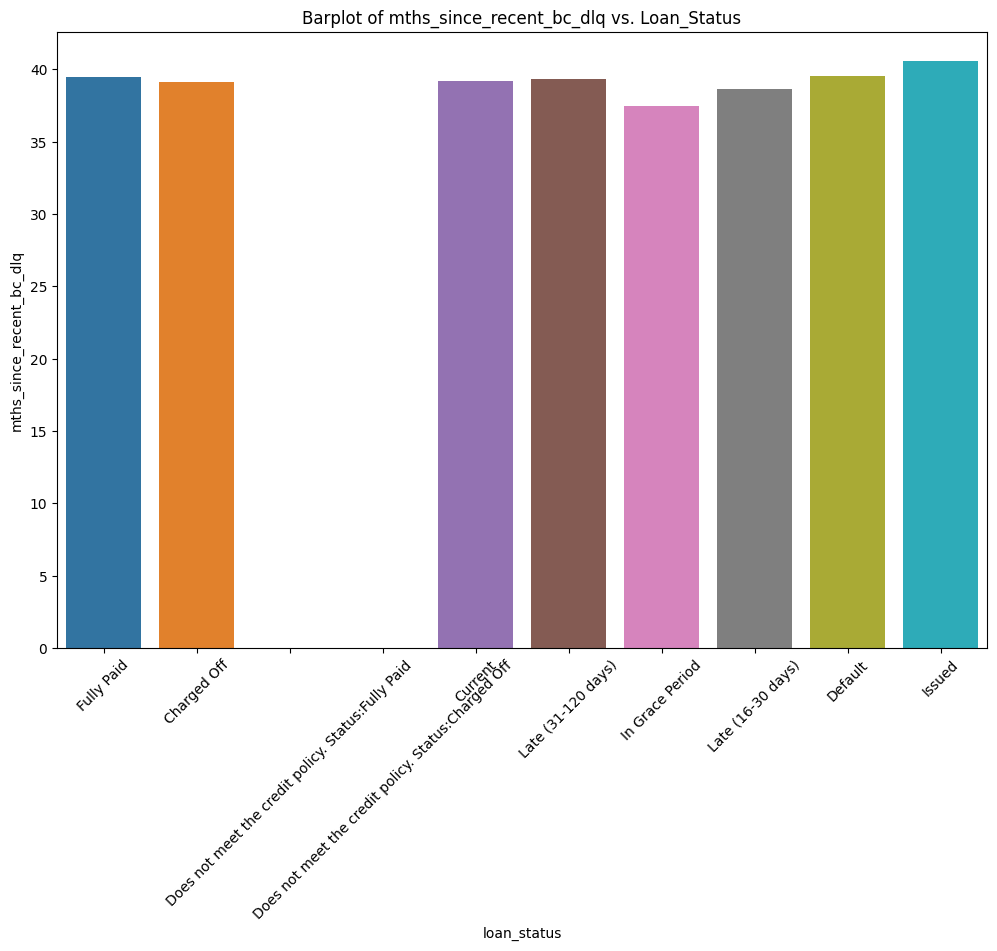

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


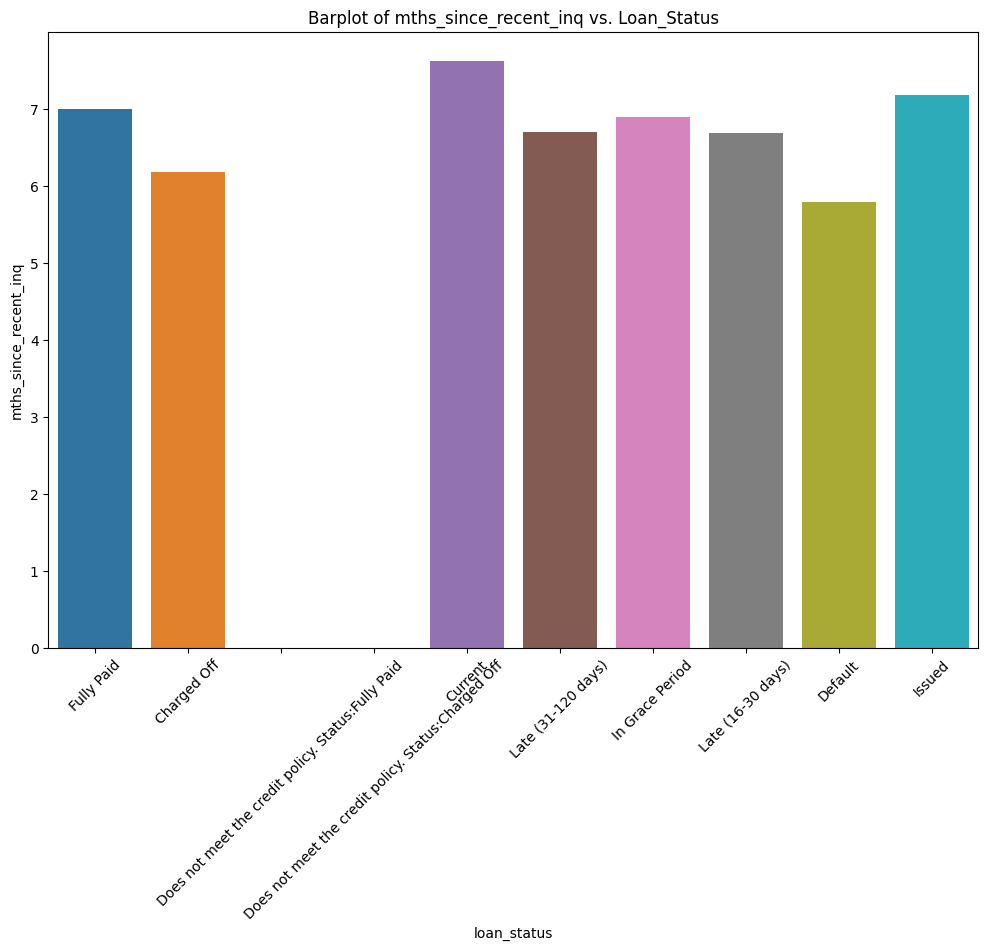

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


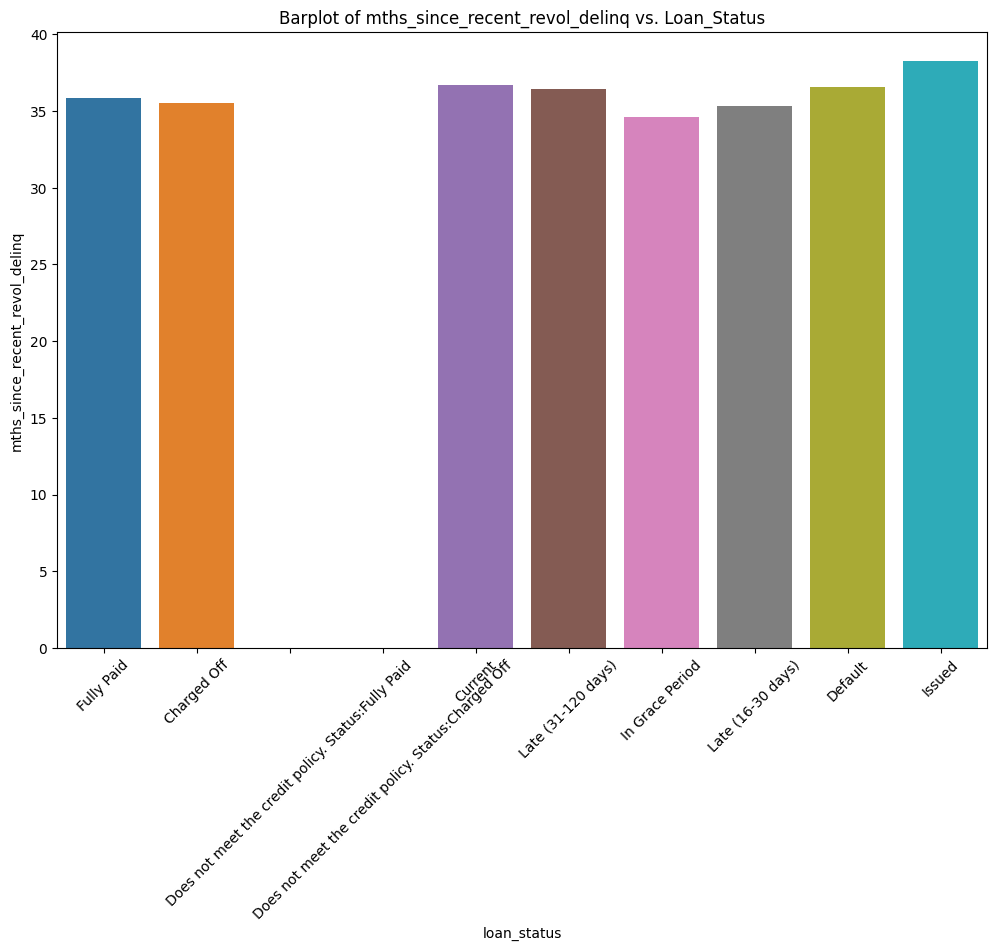

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


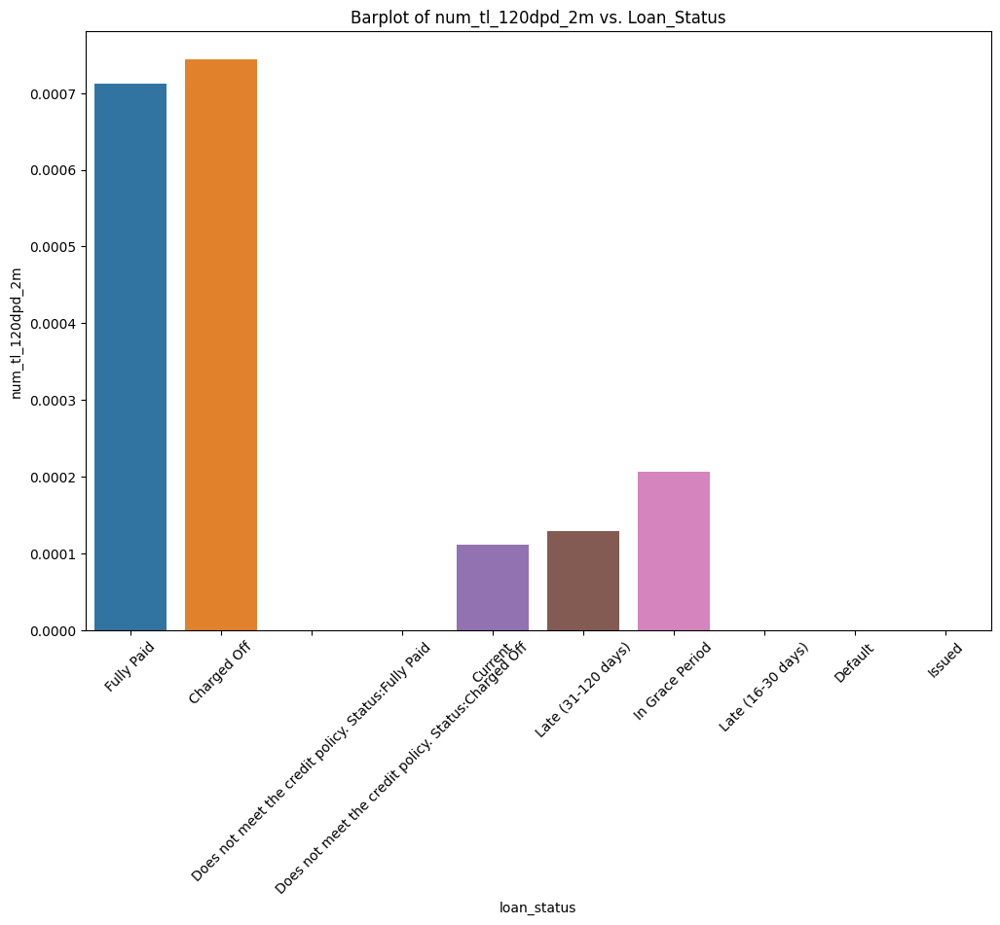

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


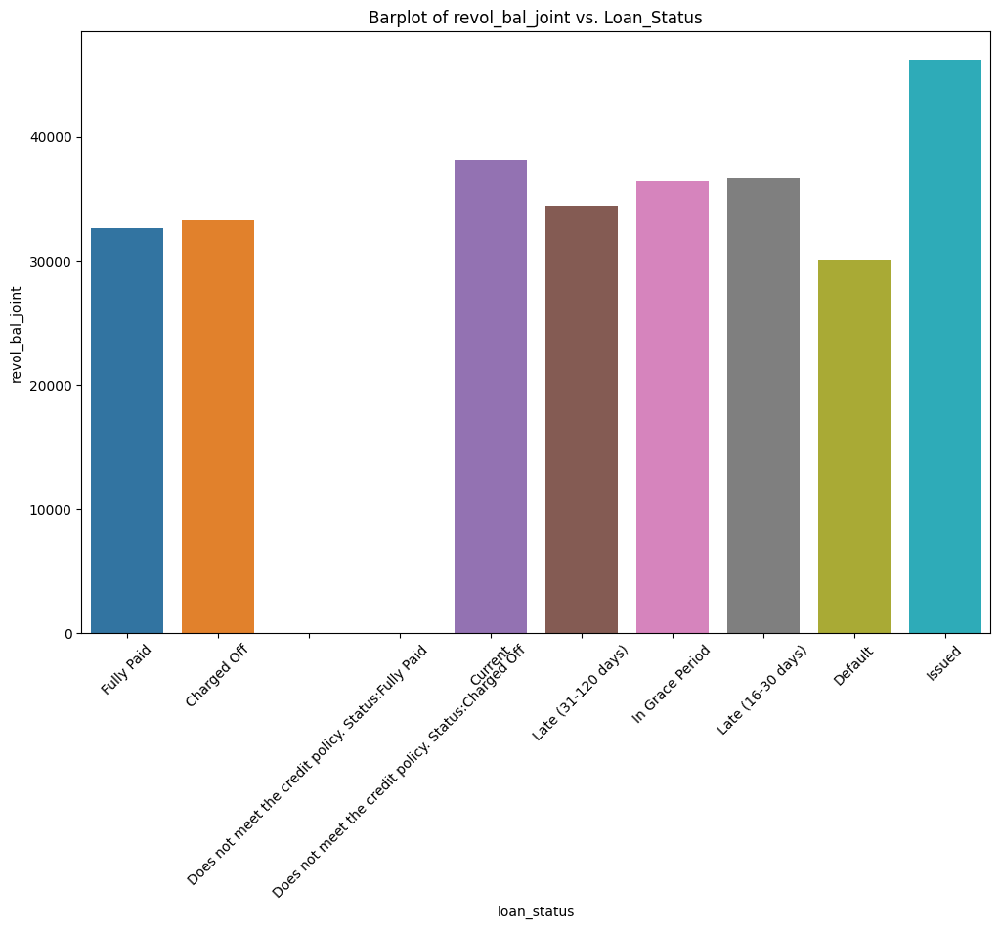

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


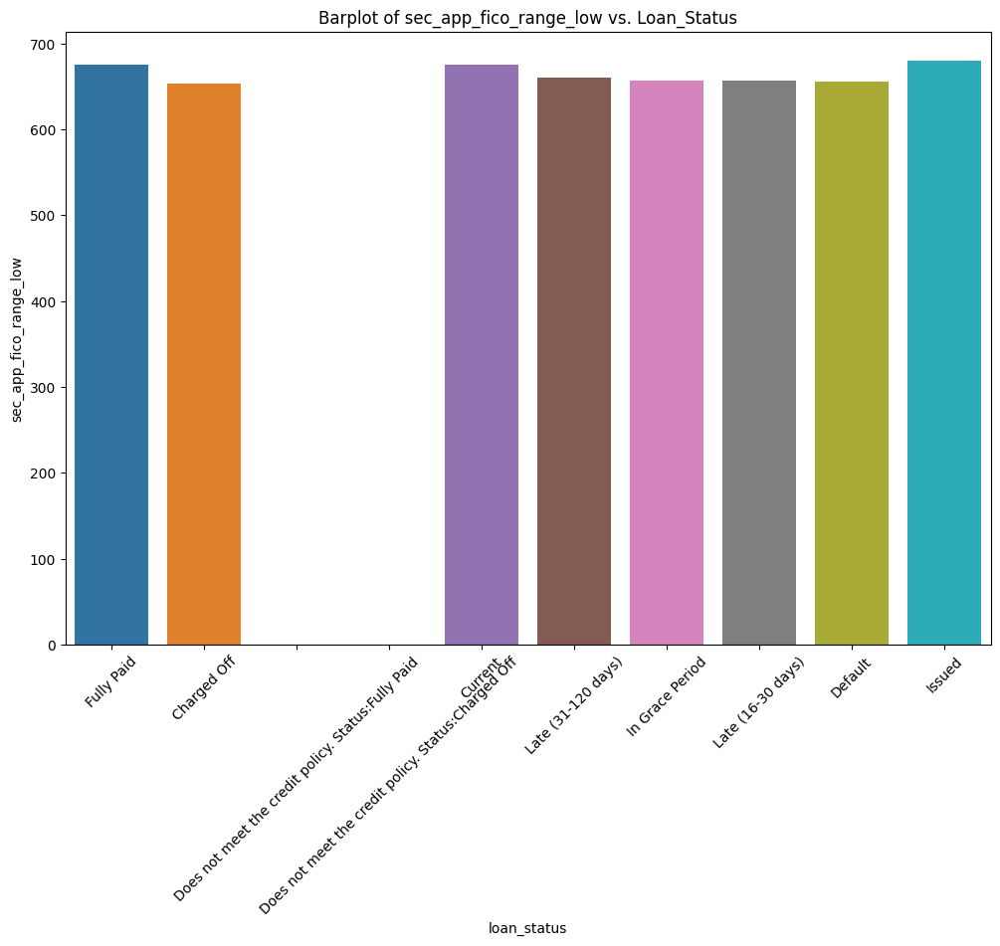

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


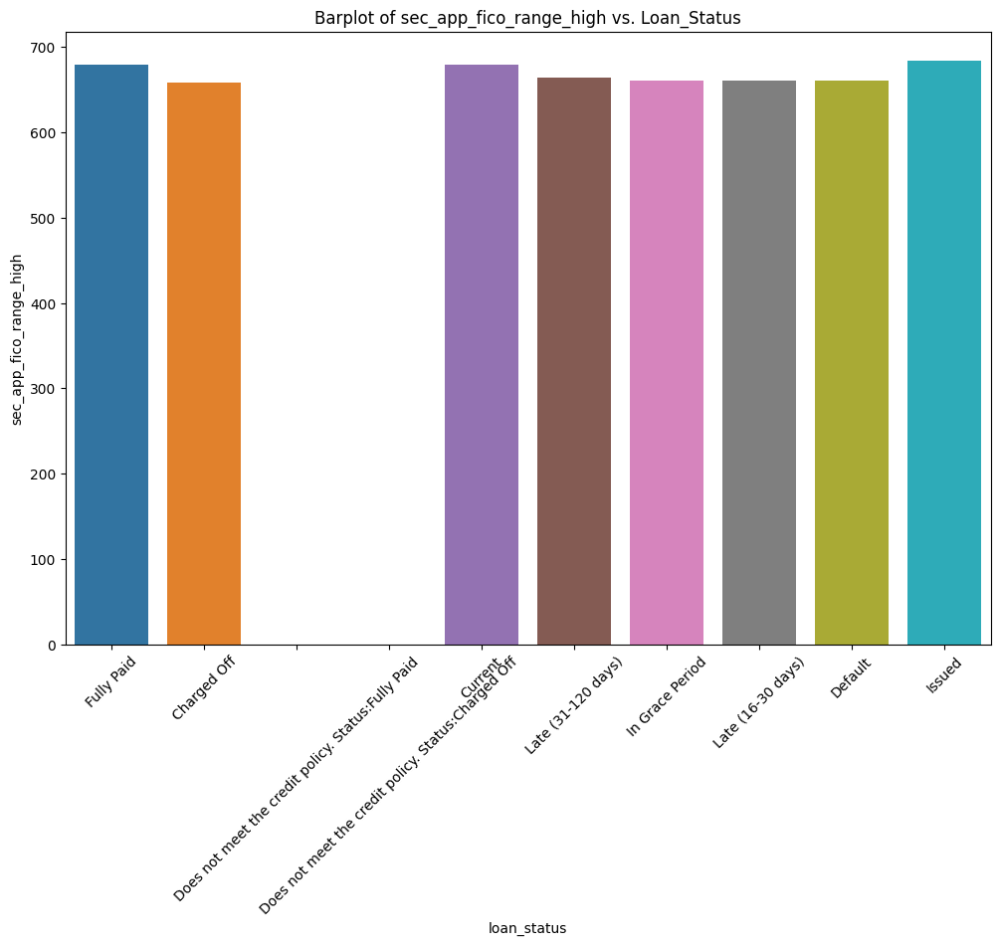

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


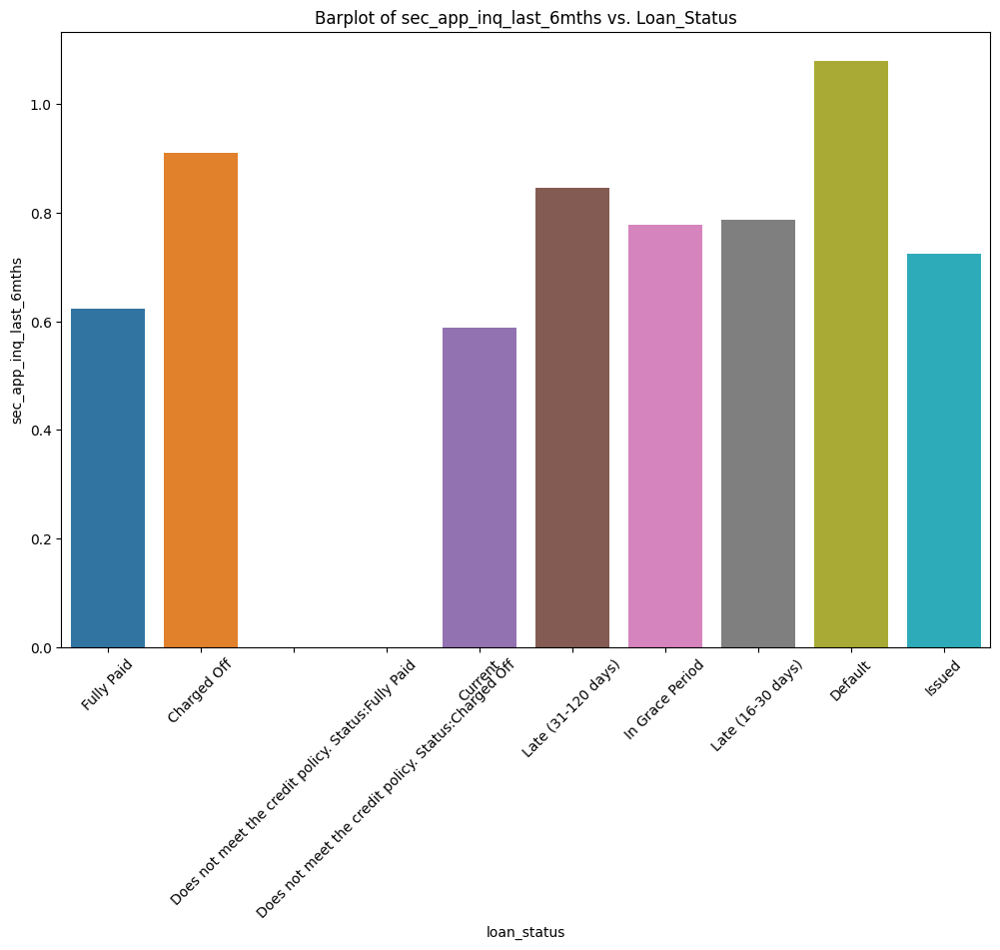

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


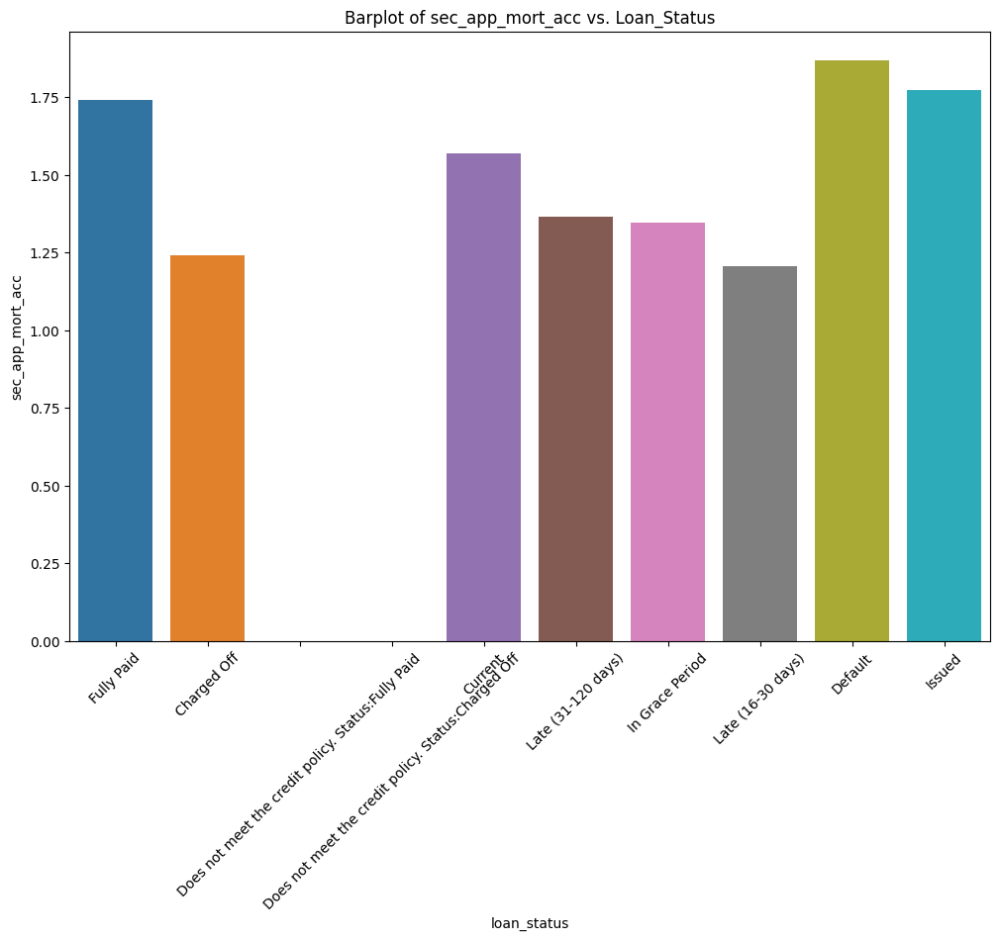

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


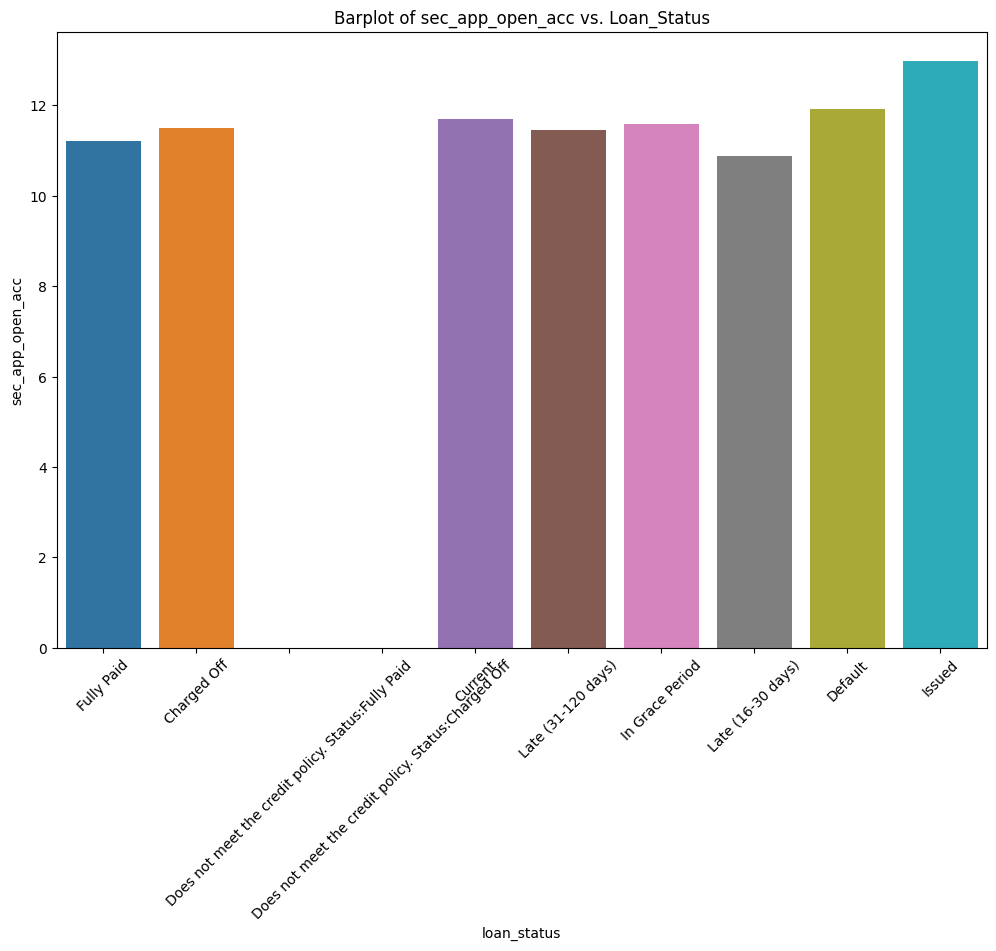

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


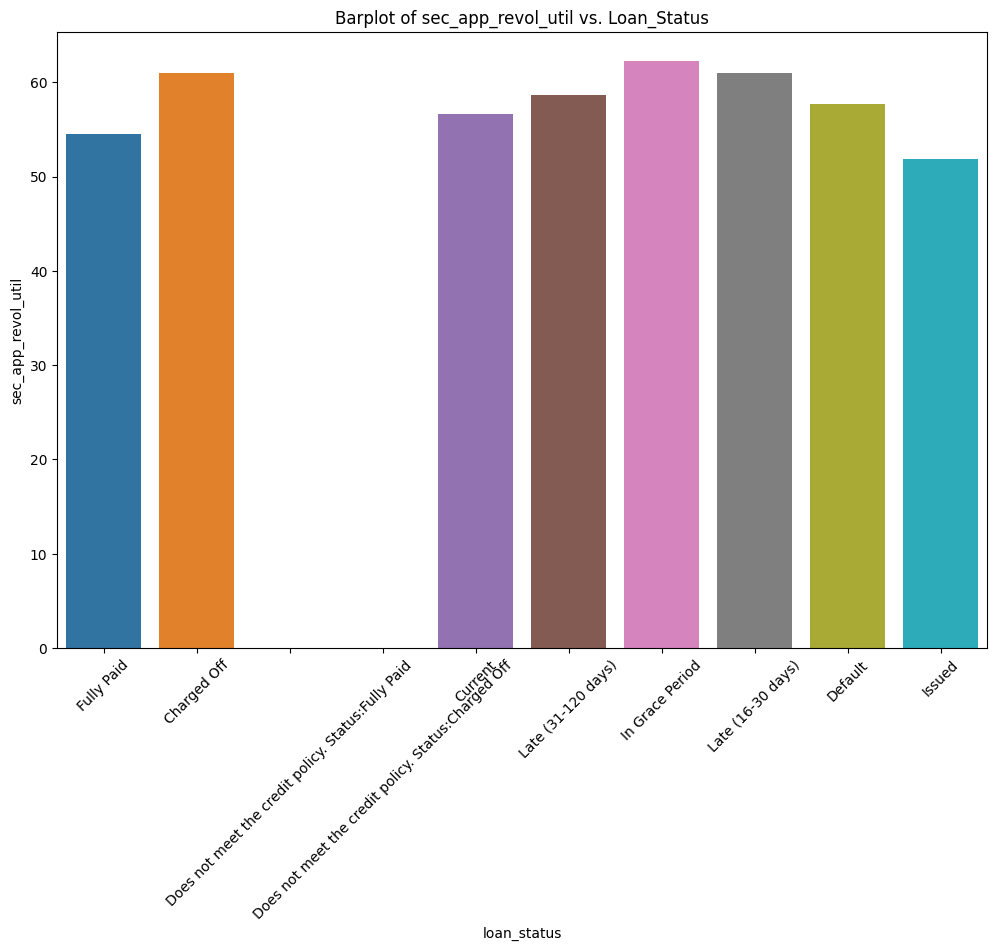

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


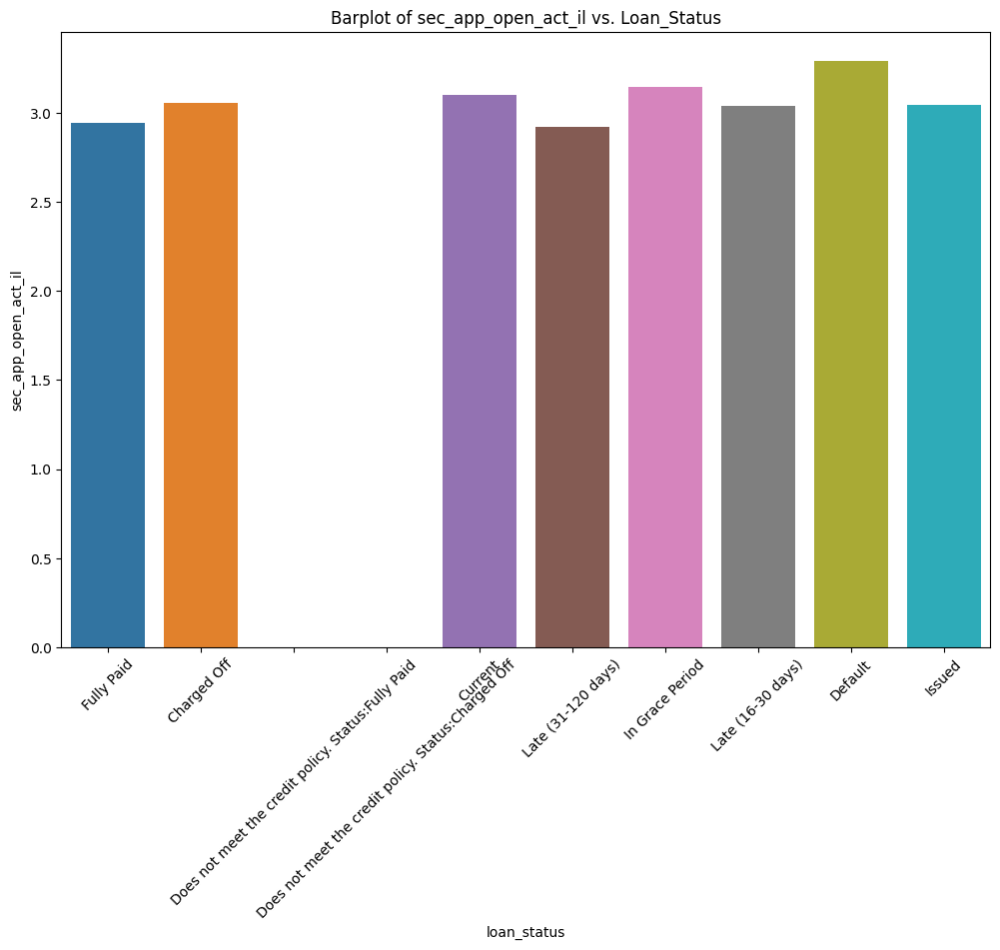

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


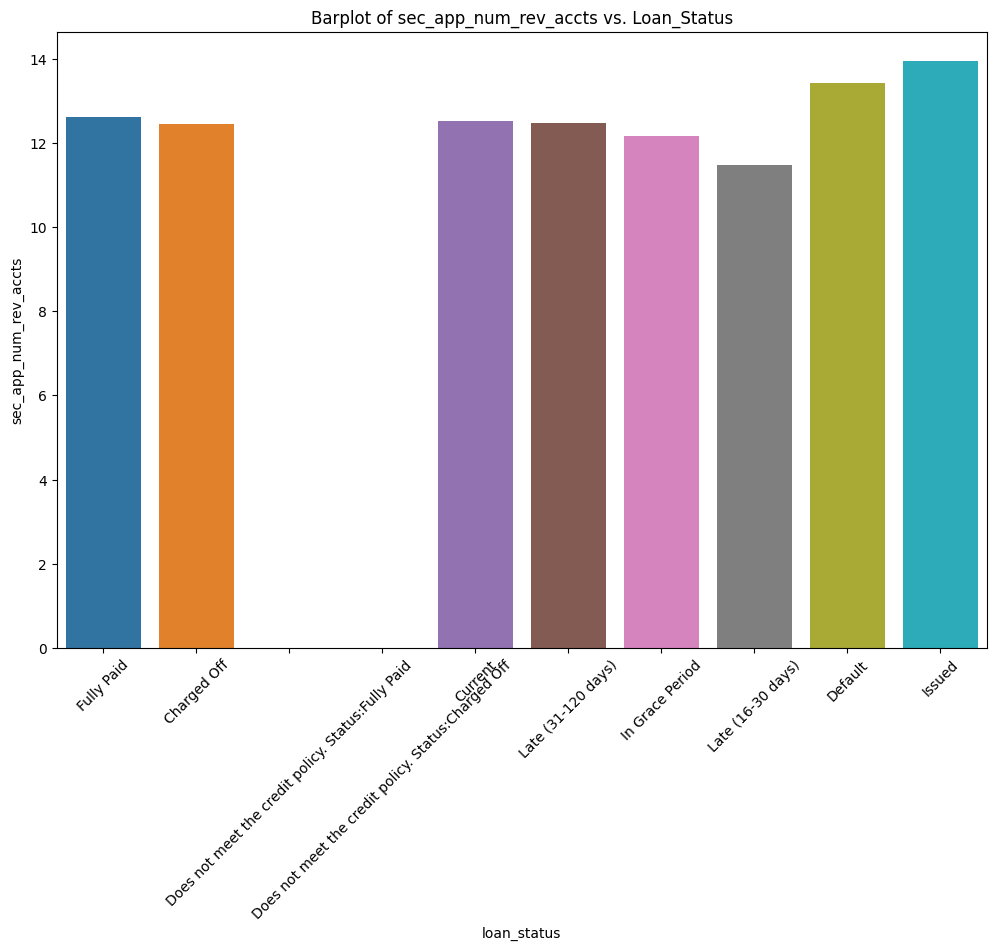

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


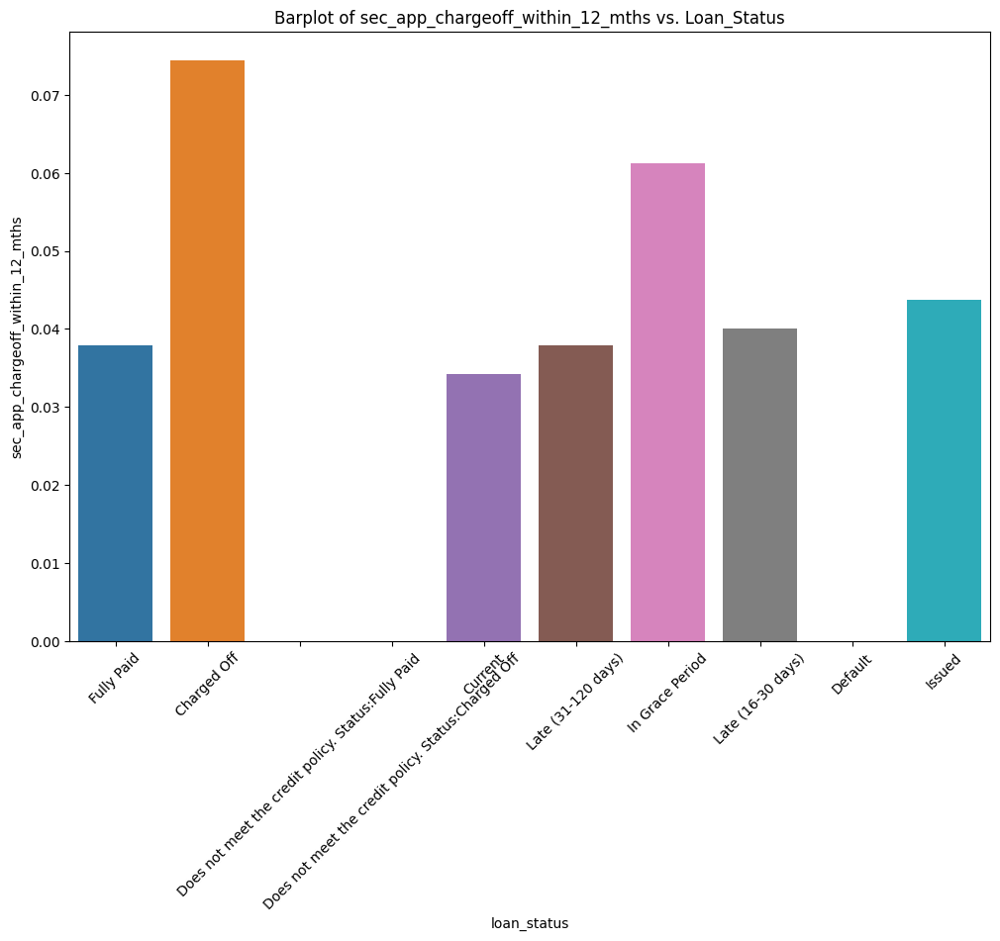

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


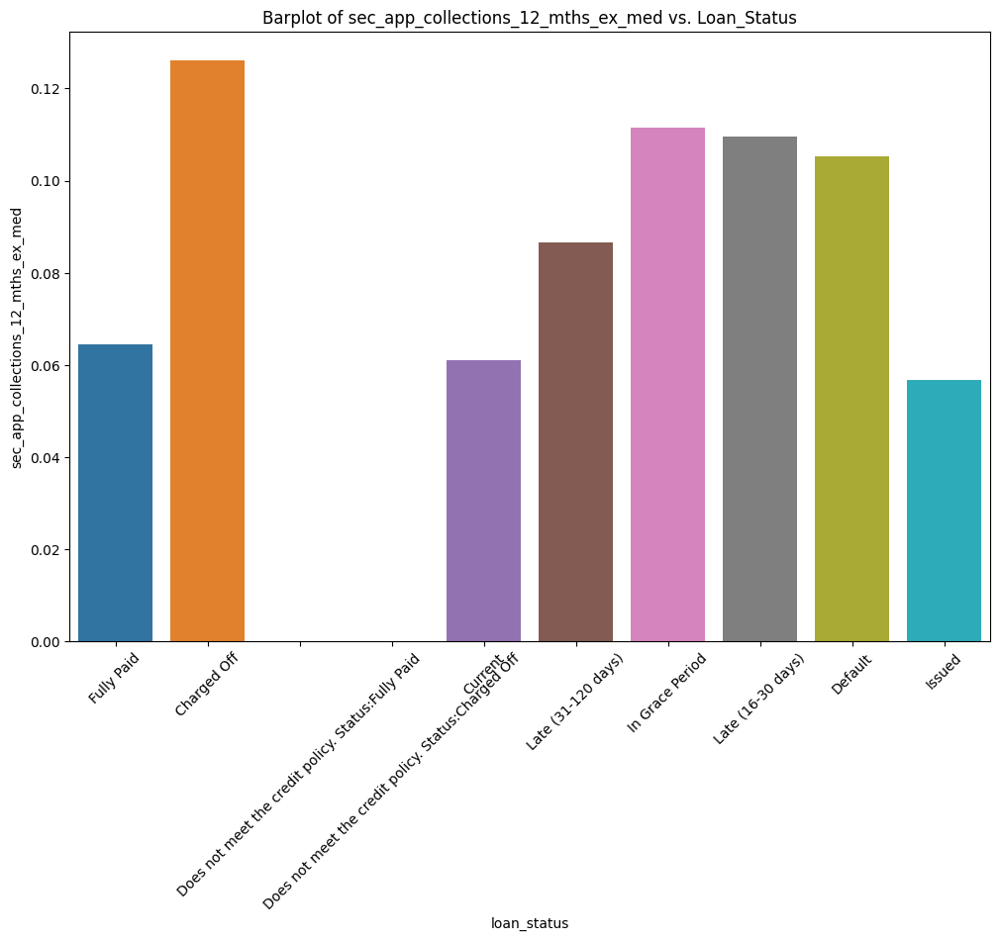

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


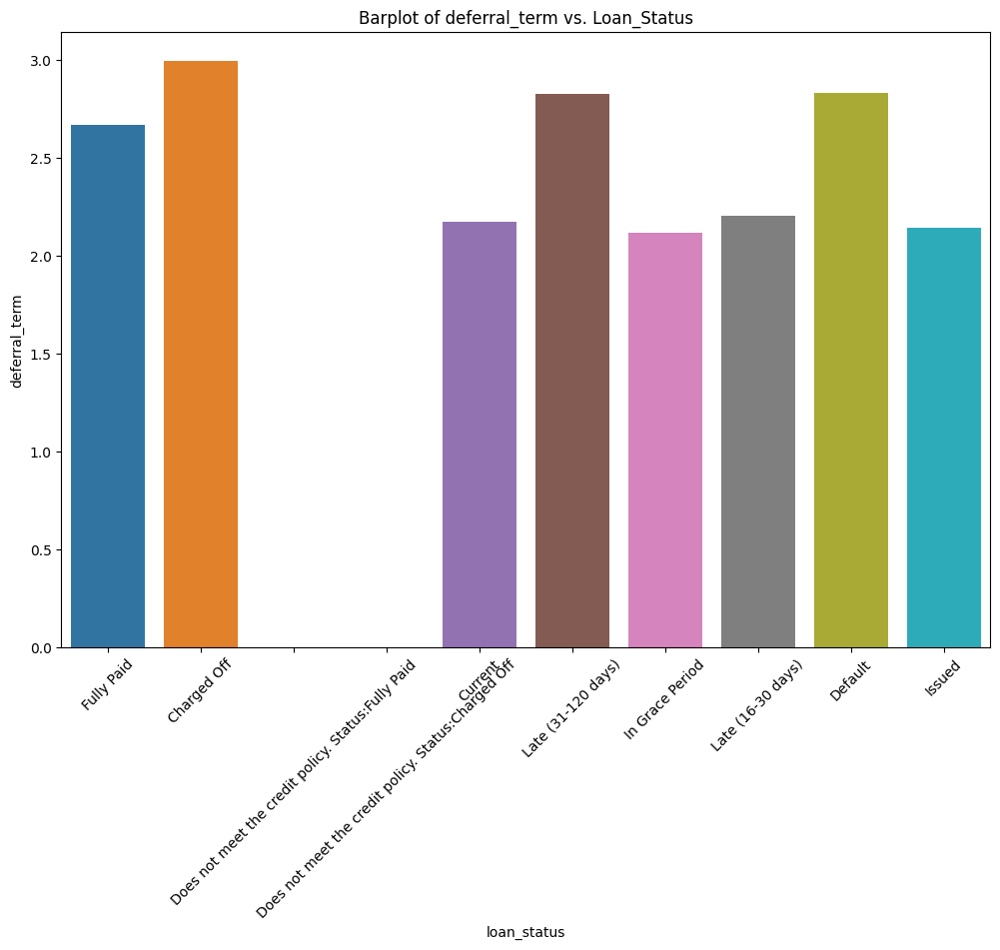

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


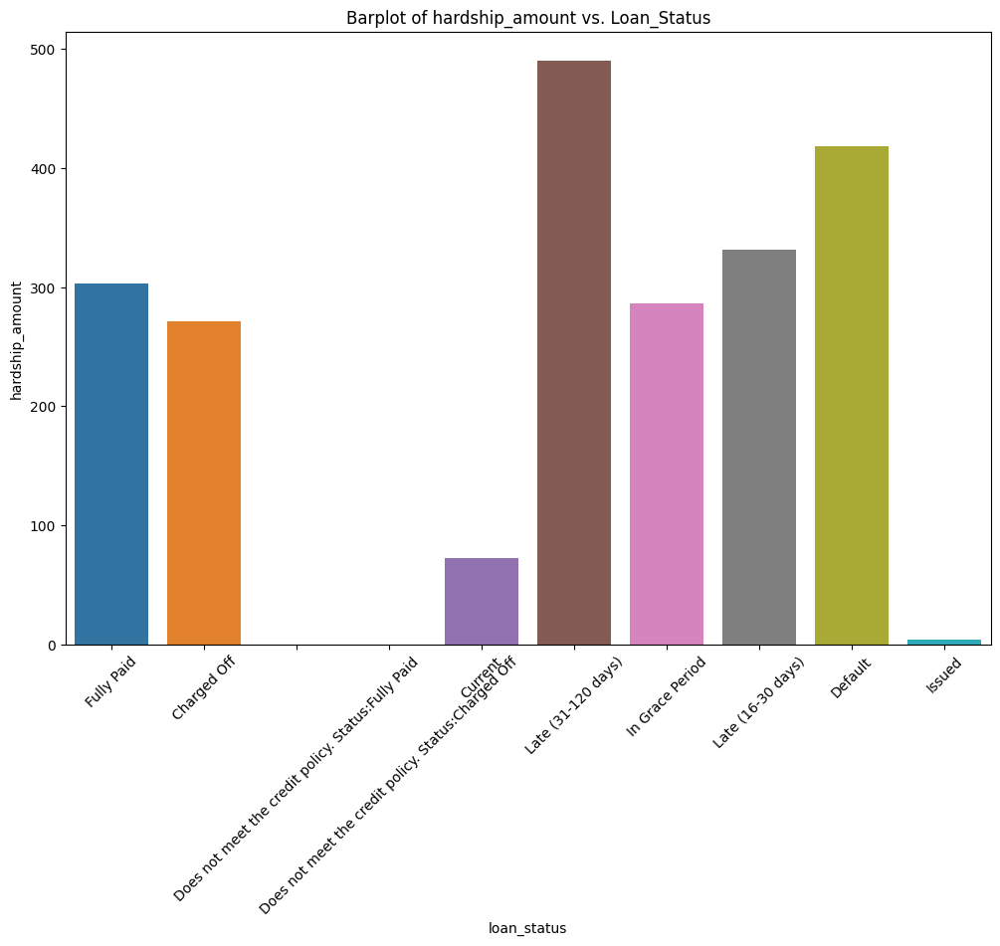

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


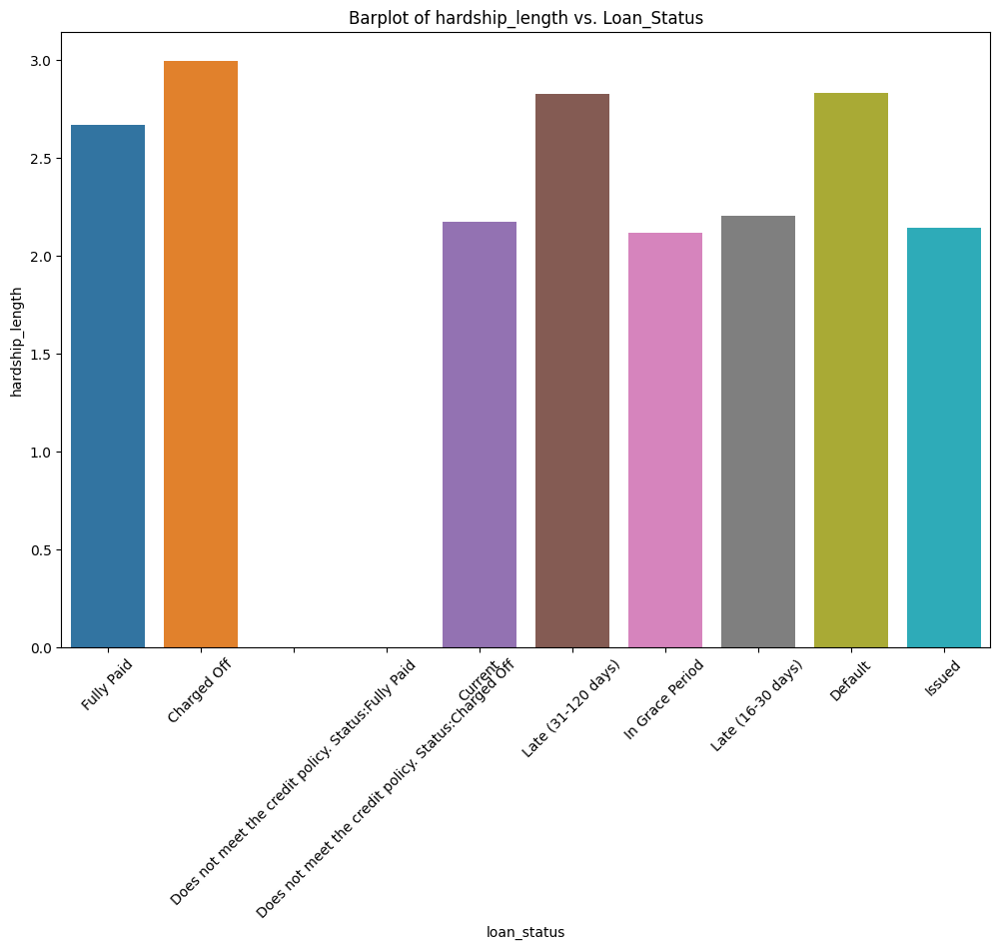

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


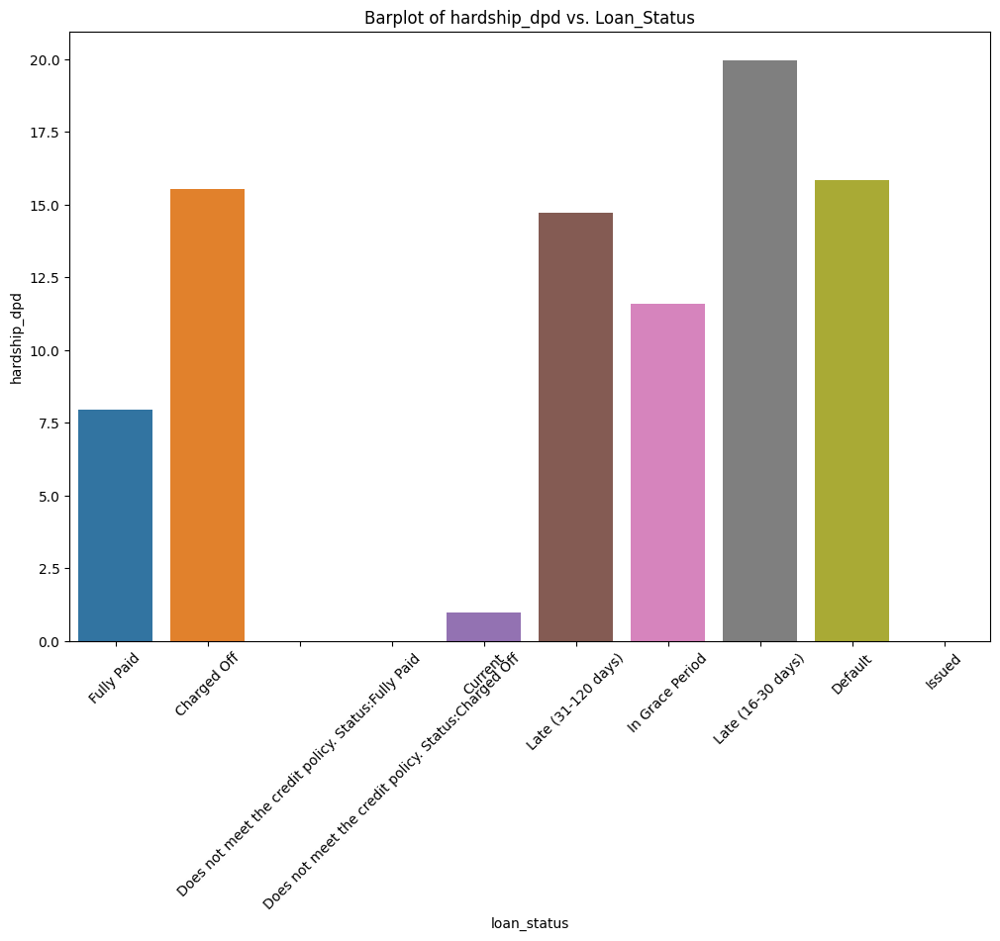

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


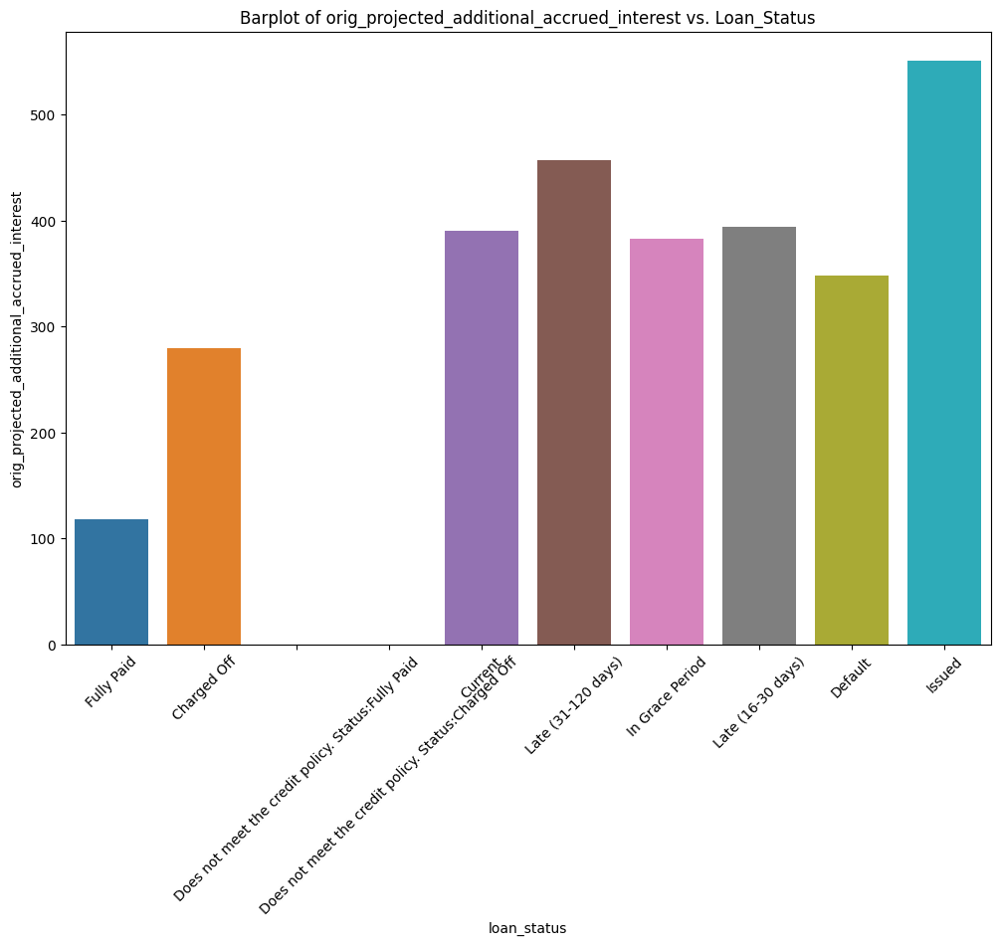

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


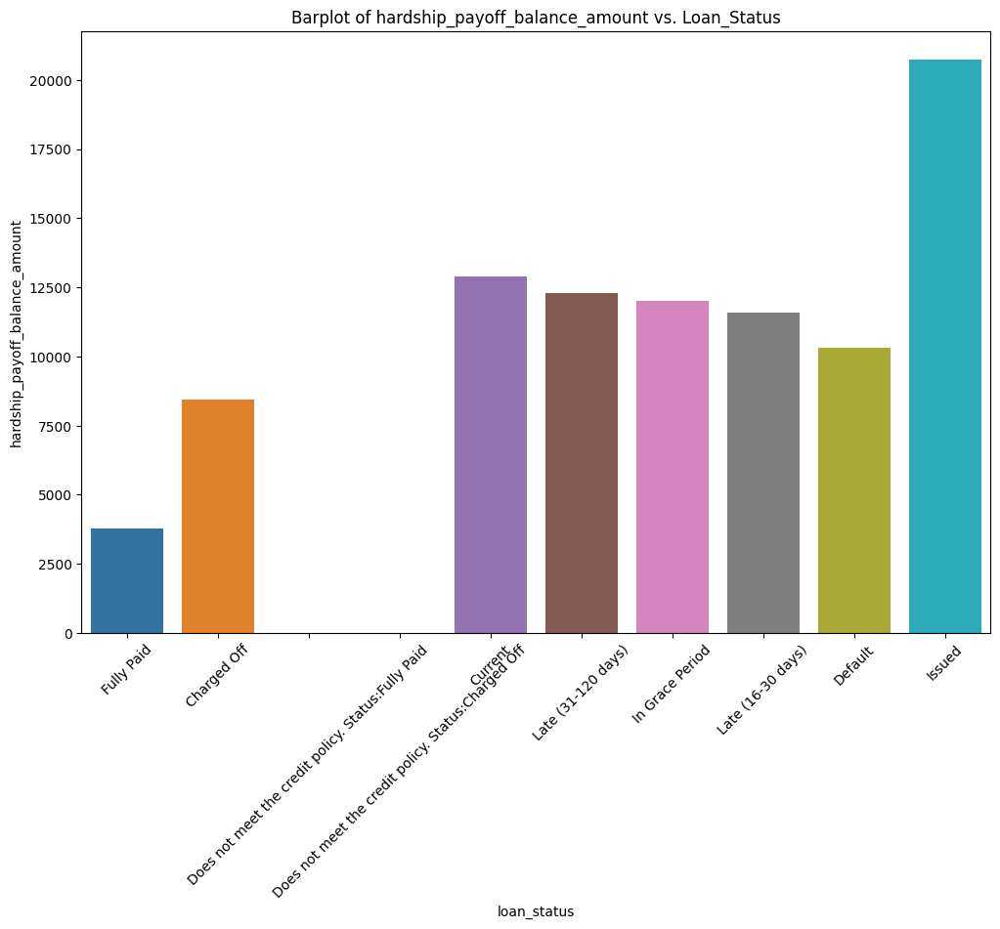

/tmp/ipykernel_32/3864666362.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=loans, x='loan_status', y=feature, ci=None)


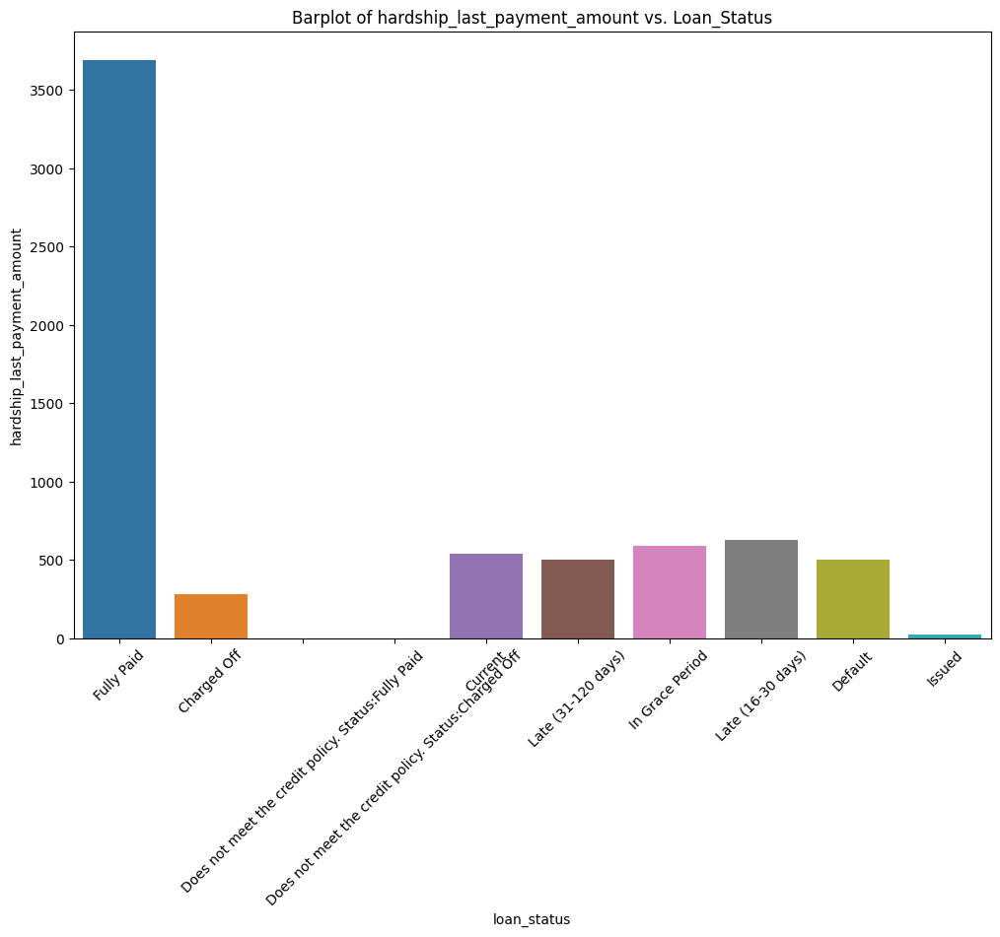

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt

numerical_features = [
    'mths_since_last_delinq', 'mths_since_last_record', 'mths_since_last_major_derog', 'annual_inc_joint', 'dti_joint',
    'open_acc_6m', 'open_act_il', 'open_il_12m', 'open_il_24m', 'mths_since_rcnt_il', 'total_bal_il', 'il_util',
    'open_rv_12m', 'open_rv_24m', 'max_bal_bc', 'all_util', 'inq_fi', 'total_cu_tl', 'inq_last_12m', 'mo_sin_old_il_acct',
    'mths_since_recent_bc_dlq', 'mths_since_recent_inq', 'mths_since_recent_revol_delinq', 'num_tl_120dpd_2m',
    'revol_bal_joint', 'sec_app_fico_range_low', 'sec_app_fico_range_high', 'sec_app_inq_last_6mths',
    'sec_app_mort_acc', 'sec_app_open_acc', 'sec_app_revol_util', 'sec_app_open_act_il', 'sec_app_num_rev_accts',
    'sec_app_chargeoff_within_12_mths', 'sec_app_collections_12_mths_ex_med', 'deferral_term', 'hardship_amount',
    'hardship_length', 'hardship_dpd', 'orig_projected_additional_accrued_interest', 'hardship_payoff_balance_amount',
    'hardship_last_payment_amount'
]

for feature in numerical_features:
    plt.figure(figsize=(12, 8))
    sns.barplot(data=loans, x='loan_status', y=feature, ci=None)
    plt.title(f'Barplot of {feature} vs. Loan_Status')
    plt.xticks(rotation=45)
    plt.show()


In [32]:
import seaborn as sns
import matplotlib.pyplot as plt

numerical_features = [
    'mths_since_last_delinq', 'mths_since_last_record', 'mths_since_last_major_derog', 'annual_inc_joint', 'dti_joint',
    'open_acc_6m', 'open_act_il', 'open_il_12m', 'open_il_24m', 'mths_since_rcnt_il', 'total_bal_il', 'il_util',
    'open_rv_12m', 'open_rv_24m', 'max_bal_bc', 'all_util', 'inq_fi', 'total_cu_tl', 'inq_last_12m', 'mo_sin_old_il_acct',
    'mths_since_recent_bc_dlq', 'mths_since_recent_inq', 'mths_since_recent_revol_delinq', 'num_tl_120dpd_2m',
    'revol_bal_joint', 'sec_app_fico_range_low', 'sec_app_fico_range_high', 'sec_app_inq_last_6mths',
    'sec_app_mort_acc', 'sec_app_open_acc', 'sec_app_revol_util', 'sec_app_open_act_il', 'sec_app_num_rev_accts',
    'sec_app_chargeoff_within_12_mths', 'sec_app_collections_12_mths_ex_med', 'deferral_term', 'hardship_amount',
    'hardship_length', 'hardship_dpd', 'orig_projected_additional_accrued_interest', 'hardship_payoff_balance_amount',
    'hardship_last_payment_amount'
]

for feature in numerical_features:
    plt.figure(figsize=(12, 8))
    sns.swarmplot(data=merged_df, x='loan_status', y=feature)
    plt.title(f'Swarm Plot of {feature} by Loan Status')
    plt.xticks(rotation=45)
    plt.show()




KeyboardInterrupt



Error in callback <function flush_figures at 0x7999c4e9e560> (for post_execute):



KeyboardInterrupt



In [23]:
# Create another Dataframe with the Null values bigger then 1 Lakh Data
    
columns_with_nulls2 = loans.columns[loans.isnull().sum() > 2000000].tolist()
missing_values_df2 = loans[columns_with_nulls2]

for col in missing_values_df: 
    print(col)
    
num_features2 = missing_values_df2.shape[1]

print("\n\n Number of feature names (columns):", num_features2)

emp_title
emp_length
mths_since_last_delinq
mths_since_last_record
next_pymnt_d
mths_since_last_major_derog
annual_inc_joint
dti_joint
verification_status_joint
open_acc_6m
open_act_il
open_il_12m
open_il_24m
mths_since_rcnt_il
total_bal_il
il_util
open_rv_12m
open_rv_24m
max_bal_bc
all_util
inq_fi
total_cu_tl
inq_last_12m
mo_sin_old_il_acct
mths_since_recent_bc_dlq
mths_since_recent_inq
mths_since_recent_revol_delinq
num_tl_120dpd_2m
revol_bal_joint
sec_app_fico_range_low
sec_app_fico_range_high
sec_app_earliest_cr_line
sec_app_inq_last_6mths
sec_app_mort_acc
sec_app_open_acc
sec_app_revol_util
sec_app_open_act_il
sec_app_num_rev_accts
sec_app_chargeoff_within_12_mths
sec_app_collections_12_mths_ex_med
hardship_type
hardship_reason
hardship_status
deferral_term
hardship_amount
hardship_start_date
hardship_end_date
payment_plan_start_date
hardship_length
hardship_dpd
hardship_loan_status
orig_projected_additional_accrued_interest
hardship_payoff_balance_amount
hardship_last_payment_amo

In [26]:
numerical_columns = loans.select_dtypes(include=['number'])

# Define a function to format each element to float with 2 decimal places
def format_to_float_with_two_decimals(x):
    if isinstance(x, (int, float)):
        return round(float(x), 2)
    return x  # Return non-numeric values as they are

# Apply the formatting function to all elements in the DataFrame
formatted_numerical_columns = numerical_columns.applymap(format_to_float_with_two_decimals)

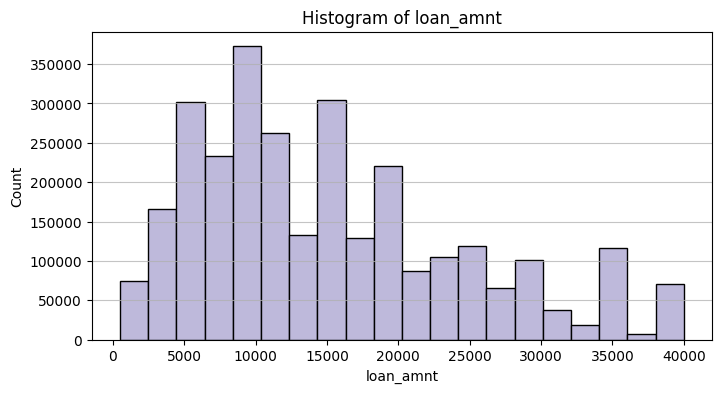

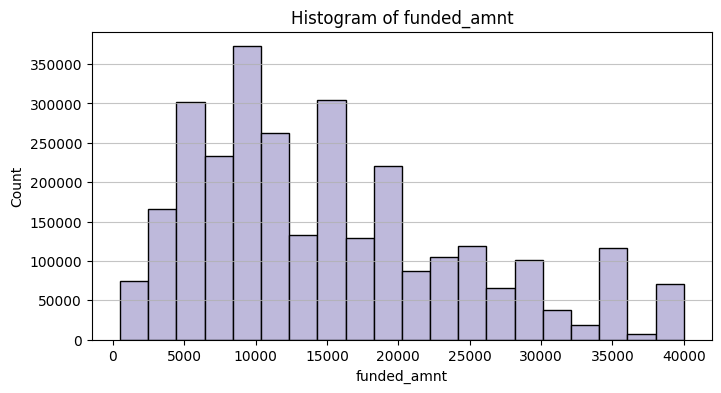

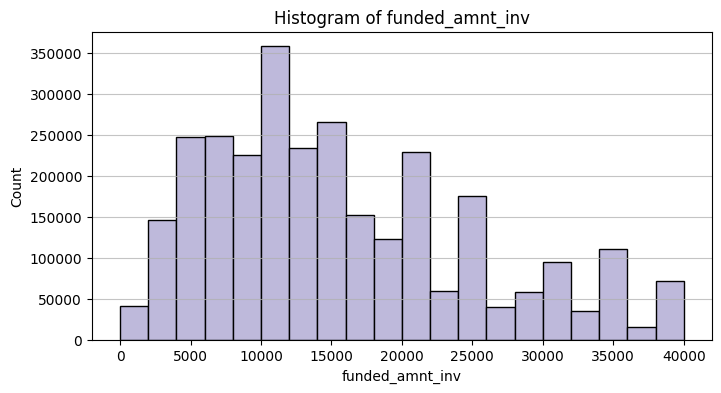

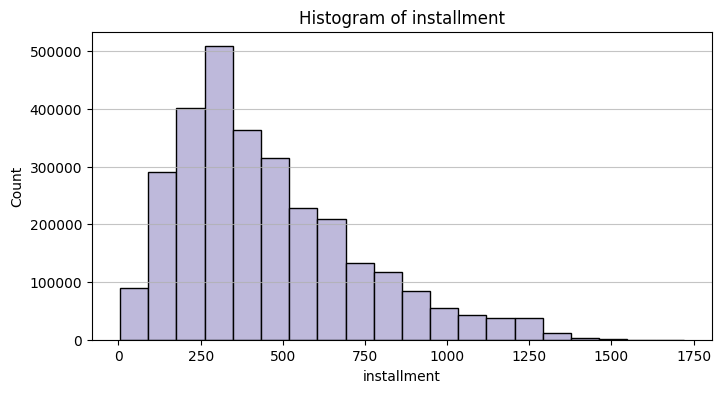

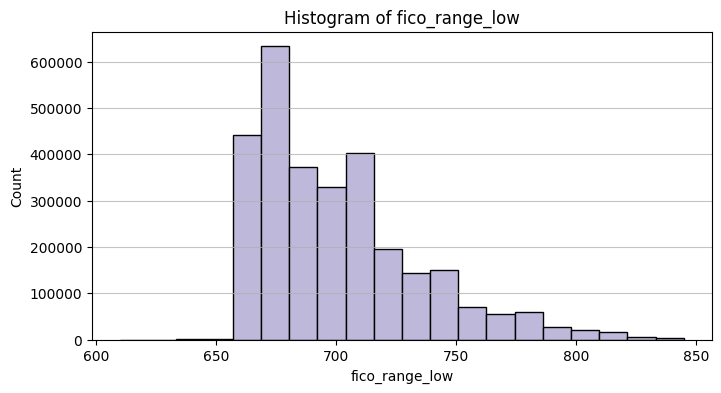

...

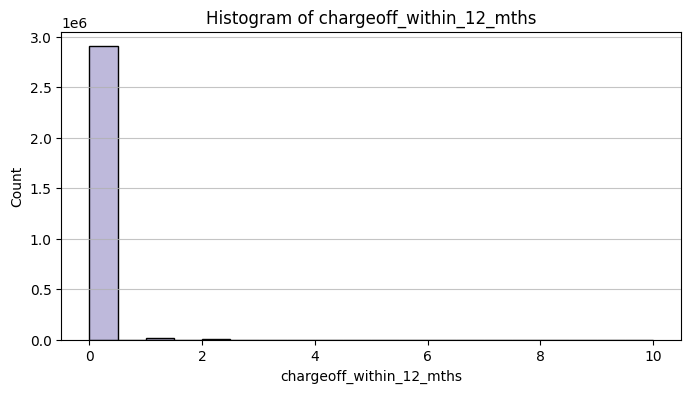

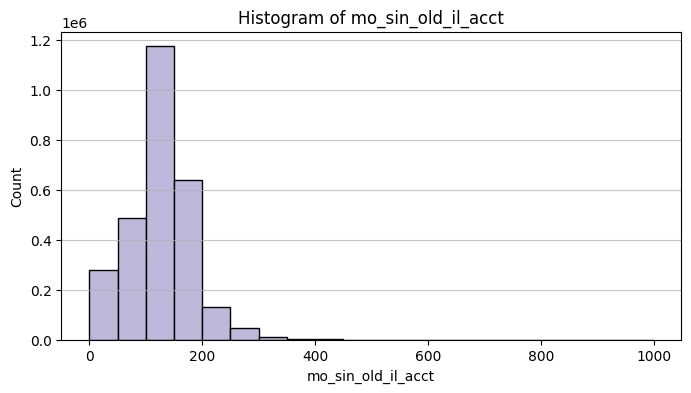

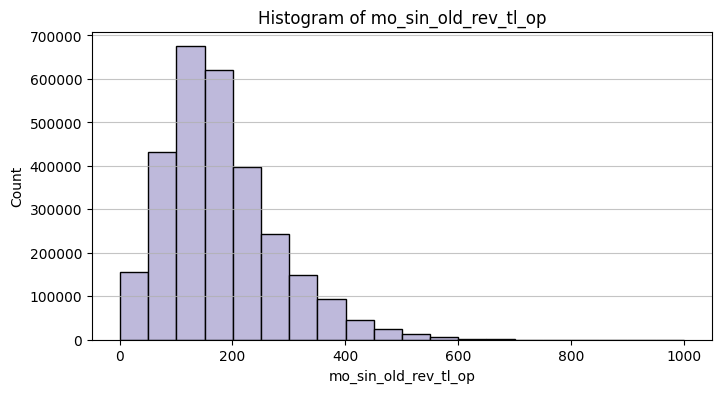

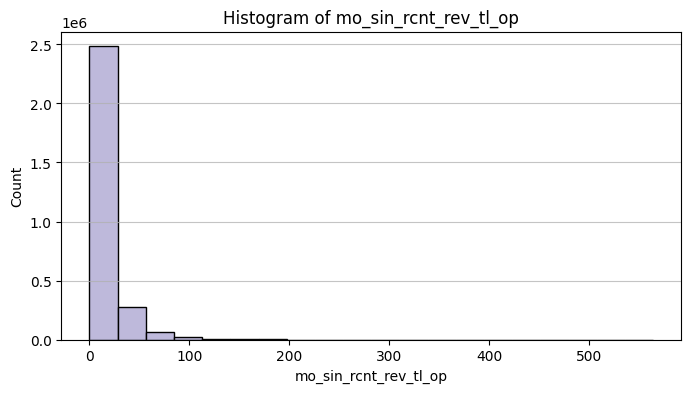

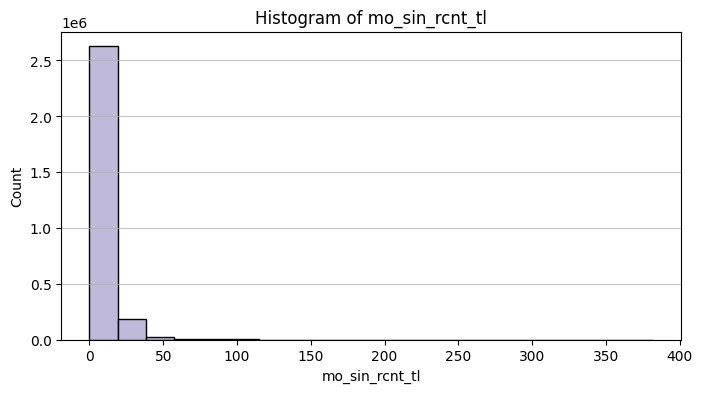

In [ ]:
numerical_features  = [
    'loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'installment', 
    'fico_range_low', 'fico_range_high', 
    'mths_since_last_delinq', 'mths_since_last_record', 'open_acc', 
    'total_acc', 'out_prncp', 'out_prncp_inv', 'total_pymnt',
    'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',   'last_pymnt_amnt', 'last_fico_range_high',
    'last_fico_range_low',  'mths_since_last_major_derog',
     'dti_joint', 
     'open_acc_6m', 'open_act_il', 'open_il_12m', 'open_il_24m',
    'mths_since_rcnt_il', 'total_bal_il', 'il_util', 'open_rv_12m', 'open_rv_24m',
     'all_util',  'inq_fi', 'total_cu_tl', 'inq_last_12m',
    'acc_open_past_24mths', 'avg_cur_bal', 'bc_open_to_buy', 'bc_util',
    'chargeoff_within_12_mths', 'mo_sin_old_il_acct',
    'mo_sin_old_rev_tl_op', 'mo_sin_rcnt_rev_tl_op', 'mo_sin_rcnt_tl', 'mort_acc',
    'mths_since_recent_bc', 'mths_since_recent_bc_dlq', 'mths_since_recent_inq',
    'mths_since_recent_revol_delinq', 'num_accts_ever_120_pd', 'num_actv_bc_tl',
    'num_actv_rev_tl', 'num_bc_sats', 'num_bc_tl', 'num_il_tl', 'num_op_rev_tl',
    'num_rev_accts', 'num_rev_tl_bal_gt_0', 'num_sats',  'num_tl_op_past_12m', 'pct_tl_nvr_dlq',
    'percent_bc_gt_75', 'pub_rec_bankruptcies', 'tax_liens', 'tot_hi_cred_lim',
    'total_bal_ex_mort', 'total_bc_limit', 'total_il_high_credit_limit', 'revol_bal_joint',
    'sec_app_fico_range_low', 'sec_app_fico_range_high', 'sec_app_inq_last_6mths',
    'sec_app_mort_acc', 'sec_app_open_acc', 'sec_app_revol_util', 'sec_app_open_act_il',
    'sec_app_num_rev_accts', 'sec_app_chargeoff_within_12_mths',
    'sec_app_collections_12_mths_ex_med', 'deferral_term', 'hardship_amount',
    'hardship_length', 'hardship_dpd', 'orig_projected_additional_accrued_interest',
    'hardship_payoff_balance_amount', 'hardship_last_payment_amount'
]


for feature in numerical_features:
    plt.figure(figsize=(8, 4))  # Set the figure size
    plt.hist(loans[feature], bins=20, color='#beb9db', edgecolor='black')
    plt.title(f'Histogram of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Count')
    plt.grid(axis='y', alpha=0.75)
    plt.show()

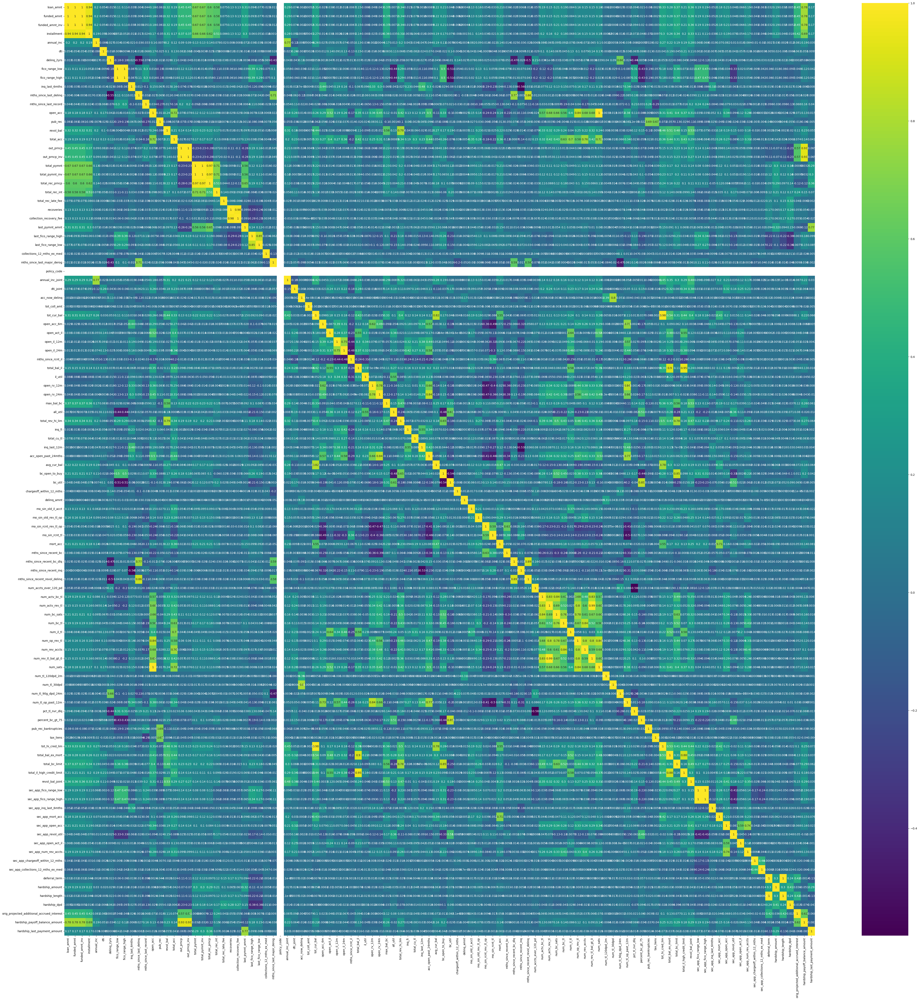

In [32]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

corr = formatted_numerical_columns.corr()
plt.figure(figsize=(60, 60))
sns.heatmap(corr, annot=True, cmap='viridis')
plt.show()

In [33]:
from sklearn.preprocessing import LabelEncoder

text_features = ['term', 'grade', 'sub_grade', 'emp_title', 'emp_length',
                 'home_ownership', 'verification_status', 'issue_d', 'loan_status',
                 'purpose', 'title', 'zip_code', 'addr_state', 'earliest_cr_line',
                 'initial_list_status', 'application_type']

# Apply Label Encoding to text features
label_encoder = LabelEncoder()
for feature in text_features:
    loans[feature] = label_encoder.fit_transform(loans[feature])


In [34]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

numerical_features = [
    'loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'int_rate', 'installment',
    'annual_inc', 'dti', 'delinq_2yrs', 'fico_range_low', 'fico_range_high',
    'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util',
    'total_acc', 'out_prncp', 'out_prncp_inv', 'total_pymnt',
    'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee',
    'recoveries', 'collection_recovery_fee', 'last_pymnt_amnt',
    'last_fico_range_high', 'last_fico_range_low', 'collections_12_mths_ex_med',
    'policy_code', 'acc_now_delinq', 'chargeoff_within_12_mths', 'delinq_amnt',
    'pub_rec_bankruptcies', 'tax_liens'
]

# Apply Standardization (Normalization) to numerical features
scaler = StandardScaler()
normalized_numerical_data = scaler.fit_transform(numerical_features)

# Create a new DataFrame with the normalized numerical features
loans = pd.DataFrame(normalized_numerical_data, columns=numerical_features)

ValueError: could not convert string to float: 'loan_amnt'

In [35]:
loans.head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,...,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,debt_settlement_flag
0,5000.0,5000.0,4975.0,0,10.65%,162.87,1,6,590413,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N
1,2500.0,2500.0,2500.0,1,15.27%,59.83,2,13,391741,10,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N
2,2400.0,2400.0,2400.0,0,15.96%,84.33,2,14,590413,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N
3,10000.0,10000.0,10000.0,0,13.49%,339.31,2,10,6973,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N
4,3000.0,3000.0,3000.0,1,12.69%,67.79,1,9,496125,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N
